# Вступление

**Отток клиентов в компании ТелеДом**

Оператор связи «ТелеДом» хочет бороться с оттоком клиентов. Для этого его сотрудники начнут предлагать промокоды и специальные условия всем, кто планирует отказаться от услуг связи. Чтобы заранее находить таких пользователей, «ТелеДому» нужна модель, которая будет предсказывать, разорвёт ли абонент договор. Команда оператора собрала персональные данные о некоторых клиентах, информацию об их тарифах и услугах. Задача — обучить на этих данных модель для прогноза оттока клиентов.

**Описание услуг**

Оператор предоставляет два основных типа услуг:

1. Стационарную телефонную связь. Телефон можно подключить к нескольким линиям одновременно.
2. Интернет. Подключение бывает двух типов: через телефонную линию DSL (англ. digital subscriber line — «цифровая абонентская линия») или оптоволоконный кабель (англ. fiber optic).

Также абонентам доступен ряд услуг:

- Интернет-безопасность: антивирус (Device Protection) и блокировка опасных сайтов (Online Security);
- Выделенная линия технической поддержки (Tech Support);
- Облачное хранилище файлов для резервного копирования данных (Online Backup);
- Стриминговое телевидение (Streaming TV) и каталог фильмов (Streaming Movies).

За услуги клиенты могут платить ежемесячно или раз в 1–2 года. Доступны различные способы расчёта и возможность получить электронный чек.

**Цель иследования:**

- предсказать отток клиентов (задача классификации)

**Ход исследования**

1. Загрузка данных
2. Исследовательский анализ и предобработка данных
3. Обучение моделей
4. Тестирование модели и демонстрация её работы
5. Общий вывод по работе

**Что важно учесть при выполнении проекта**

Как известно данные не идельны. Во время загрузки, преоразования из одного формата в другой могут возникнуть технологические ошибки. Так же во время наполнения базы обсерватории сотрудники могли допустить различные опечатки, либо перепутать переменные в столбцах, ведь человеческий фактор присутствует в любой сфере. Поэтому для качественного выполнения проекта необходимо основательно сделать предобработку данных и обратить внимание на следующие моменты:

1. описать найденные в данных проблемы,
2. применить различные методы: замену типов данных, обработку пропусков, обработку явных и не явных дубликатов,
3. использовать категоризацию данных,
4. применить четкую  структуру проекта и придерживаться хорошего стиля при написании кода,
5. обозначить выводы по этапам,
6. кратко комментировать шаги,
7. использовать срезы данных,
8. построить графики для решения задич,
9. использовать различные методы построения графиков,
10. использовать сводные таблицы для вывода данных,
11. объяснить, как коррелируют между собой различные величины или показатели.

# Исследовательский анализ данных

Exploratory Data Analysis — является важным этапом, который позволяет лучше понять данные и выявить основные характеристики и закономерности.

Данные хранятся в Sqlite — СУБД, в которой база данных представлена одним файлом. Признаковое описание для таблиц:

- `contract` — информация о договорах;
- `personal` — персональные данные клиентов;
- `internet` — информация об интернет-услугах;
- `phone` — информация об услугах телефонии.

**Таблица `contract`**

- `customerID` — ID абонента;
- `BeginDate` — дата начала действия договора;
- `EndDate` — дата окончания действия договора;
- `Type` — тип оплаты: раз в год-два или ежемесячно;
- `PaperlessBilling` — электронный расчётный лист;
- `PaymentMethod` — тип платежа;
- `MonthlyCharges` — расходы за месяц;
- `TotalCharges` — общие расходы абонента.

**Таблица `personal`**

- `customerID` — ID пользователя;
- `gender` — пол;
- `SeniorCitizen` — является ли абонент пенсионером;
- `Partner` — есть ли у абонента супруг или супруга;
- `Dependents` — есть ли у абонента дети.

**Таблица `internet`**

- `customerID` — ID пользователя;
- `InternetService` — тип подключения;
- `OnlineSecurity` — блокировка опасных сайтов;
- `OnlineBackup` — облачное хранилище файлов для резервного копирования данных;
- `DeviceProtection` — антивирус;
- `TechSupport` — выделенная линия технической поддержки;
- `StreamingTV` — стриминговое телевидение;
- `StreamingMovies` — каталог фильмов.

**Таблица `phone`**

- `customerID` — ID пользователя;
- `MultipleLines` — подключение телефона к нескольким линиям одновременно.

Информация о договорах актуальна на 1 февраля 2020.

In [1]:
!pip3 install phik -q
!pip install optuna -q
!pip install --upgrade seaborn -q
!pip install graphviz -q
!pip install keras -q
!pip install --upgrade imbalanced-learn -q
!pip install shap -q

In [2]:
import pandas as pd # Анализ и обработка
import numpy as np # Математический модуль
import os # Взаимодействие с путями файлов
import matplotlib.pyplot as plt # Менеджер графического интерфейса фигур
from matplotlib.ticker import MaxNLocator # Максим. количество интервалов
import seaborn as sns # Интерфейс для рисования на основе matplotlib
import sqlite3 # Для обработки реляционных баз данных
import re # Регулярные выражения
import random # Генерация случайных чисел
from phik import phik_matrix # Корреляционная матрица
from phik.report import plot_correlation_matrix # Объект матрицы
from sklearn.model_selection import (
    train_test_split, # Разделение на выборки
    cross_val_score # Кросс-валидация
)
from sklearn.preprocessing import (
    OneHotEncoder, # Категориальные признаки в чяисловой массив
    StandardScaler, # Стандартизация, масштабирование до единичной дисперсии
    MinMaxScaler, # Масштабирование до заданного диапазона
    RobustScaler, # Масштабирование с статистикой, устойчивой к выбросам
)
from sklearn.tree import (
    DecisionTreeClassifier, # Классификатор дерева решений
    plot_tree # График дерева решений
)
from sklearn.metrics import (
    # Точность, доля правильных предсказаний среди всех предсказаний
    accuracy_score, 
    # Полнота, отношение истинно положительных к ложноотрицательным
    recall_score,
    # Точность, доля предсказанных положительных примеров правильная
    precision_score, 
    roc_auc_score, # Площадь под кривой рабочей характеристики (ROC AUC)
    confusion_matrix, # Матрица ошибок
    roc_curve, # ROC-кривая
    auc # Площадь под кривой
)
from sklearn.impute import SimpleImputer # Заполнения пропущенных значений
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from imblearn.combine import SMOTETomek # Oversampling и Undersampling
from lightgbm import LGBMClassifier # Градиентный бустинг
from sklearn.neural_network import MLPClassifier  # Нейронная из scikit-learn
import time # Отсчет времени
import optuna # Бейсовская оптимизация
from optuna import visualization 
import shap # Интерпретация обучения
import os # Взаимодействие с операционной системой
import urllib.request # Открытие URL-адресов
from sklearn.dummy import DummyClassifier # Проверка на адекватность

# Вывод всех столбцов и строк, независимо от их количества.
pd.set_option('display.max_columns', None)

## Загрузка данных

In [3]:
# Константа
RANDOM_STATE = 300625

In [4]:
# Загружка базы данных
path_to_db = 'ds-plus-final.db'
if not os.path.exists(path_to_db):
    print("Загрузка базы данных...")
    urllib.request.urlretrieve('https://code.s3.yandex.net/data-scientist/ds-plus-final.db', path_to_db)
else:
    print("Файл уже существует.")

Файл уже существует.


In [5]:
# Подключение к базе данных
con = sqlite3.connect(path_to_db)

# Список таблиц
tables = [
    {'table_name': 'contract'},
    {'table_name': 'personal'},
    {'table_name': 'internet'},
]

# Словарь датафреймов
dfs = {}

# Список существующих таблиц
cur = con.cursor()
cur.execute("SELECT name FROM sqlite_master WHERE type='table';")
existing_tables = cur.fetchall()
existing_table_names = [item[0] for item in existing_tables]

# Чтение таблицы
for table in tables:
    if table['table_name'] not in existing_table_names:
        print(f"Таблица {table['table_name']} не найдена!")
        continue

    query = f'SELECT * FROM {table["table_name"]}'
    df = pd.read_sql_query(query, con, index_col='customerID')
    dfs[table['table_name']] = df

# Таблица phone отдельно
query_phone = 'SELECT * FROM phone'
dfs['phone'] = pd.read_sql_query(query_phone, con, index_col='CustomerId')

con.close()

In [6]:
# Функция отображения общей информации о таблицах
def info(dfs_dict):
    '''
    :param dataframes_dict: Словарь вида {название датафрейма: датафрейм}
    '''

    # Итерация по ключам и значениям словаря
    for name, df in dfs_dict.items():
        print('Название датафрейма:', name)
        print('---------------------------------------------')
        df.info()
        print('---------------------------------------------')
        display(df.sample(5))
        print('---------------------------------------------')

In [7]:
info(dfs)

Название датафрейма: contract
---------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   BeginDate         7043 non-null   object
 1   EndDate           7043 non-null   object
 2   Type              7043 non-null   object
 3   PaperlessBilling  7043 non-null   object
 4   PaymentMethod     7043 non-null   object
 5   MonthlyCharges    7043 non-null   object
 6   TotalCharges      7043 non-null   object
dtypes: object(7)
memory usage: 440.2+ KB
---------------------------------------------


,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
customerID,,,,,,,
4622-YNKIJ,2017-05-01,No,Two year,Yes,Electronic check,88.95,2935.35
3999-WRNGR,2015-02-01,No,Month-to-month,Yes,Electronic check,49.75,3134.25
4013-TLDHQ,2018-05-01,No,Month-to-month,Yes,Electronic check,78.25,1676.12
7879-CGSFV,2015-07-01,No,One year,Yes,Mailed check,100.9,5993.46
3259-FDWOY,2014-01-01,2018-01-01,Two year,Yes,Bank transfer (automatic),106.0,5088.0


---------------------------------------------
Название датафрейма: personal
---------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   gender         7043 non-null   object
 1   SeniorCitizen  7043 non-null   object
 2   Partner        7043 non-null   object
 3   Dependents     7043 non-null   object
dtypes: object(4)
memory usage: 275.1+ KB
---------------------------------------------


,gender,SeniorCitizen,Partner,Dependents
customerID,,,,
6583-QGCSI,Female,1,Yes,No
7017-VFHAY,Female,0,Yes,Yes
6715-OFDBP,Male,0,No,No
3669-OYSJI,Male,0,No,No
7801-KICAO,Female,0,No,No


---------------------------------------------
Название датафрейма: internet
---------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Index: 5517 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   InternetService   5517 non-null   object
 1   OnlineSecurity    5517 non-null   object
 2   OnlineBackup      5517 non-null   object
 3   DeviceProtection  5517 non-null   object
 4   TechSupport       5517 non-null   object
 5   StreamingTV       5517 non-null   object
 6   StreamingMovies   5517 non-null   object
dtypes: object(7)
memory usage: 344.8+ KB
---------------------------------------------


,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
customerID,,,,,,,
9995-HOTOH,DSL,Yes,Yes,Yes,No,Yes,Yes
7721-JXEAW,DSL,No,Yes,No,No,No,Yes
1432-FPAXX,DSL,No,Yes,No,No,No,No
4079-WWQQQ,DSL,Yes,Yes,Yes,Yes,Yes,Yes
9473-CBZOP,DSL,Yes,No,Yes,No,No,No


---------------------------------------------
Название датафрейма: phone
---------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Index: 6361 entries, 5575-GNVDE to 3186-AJIEK
Data columns (total 1 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   MultipleLines  6361 non-null   object
dtypes: object(1)
memory usage: 99.4+ KB
---------------------------------------------


,MultipleLines
CustomerId,
8878-HMWBV,No
8495-PRWFH,Yes
4576-CSAJH,No
4753-PADAS,Yes
6689-TCZHQ,No


---------------------------------------------


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

После первичного осмотра таблиц ясно следующее:

1. в фрейме `phone` имя столбца `CustomerId` отличается от имени в техническом задании. Необходимо сделать такое же, как у остальных таблиц;
3. все таблицы содержат данные;
4. количество таблиц соответствует условию задачи;
5. тип столбцов `MonthlyCharges и TotalCharges` не соответствует данным, которые в нем находятся.

## Предобработка

In [8]:
# Изменение названия столбца
dfs['phone'].index.name = 'customerID'

In [9]:
# Функция форматирования названия столбцов
def split(text):
    # Регулярное выражение для выделения заглавных букв
    parts = re.findall('[A-Z][^A-Z]*', text)
    if parts:
        # Регулярное выражение для выделения заглавных букв
        result = "_".join(parts).lower()
    else:
        # Если заглавных букв нет, исходное имя столбца
        result = text.lower()

    return result

# Цикл по датафреймам в словаре
for key, df in dfs.items():
    # Приминение к каждому названию столбца
    df.rename(
        columns={col: split(col) for col in df.columns},
        inplace=True
    )

In [10]:
# Проверка
for name, df in dfs.items():
    print(f"Датафрейм: {name}\nСтолбцы: {list(df.columns)}\n")

Датафрейм: contract
Столбцы: ['begin_date', 'end_date', 'type', 'paperless_billing', 'payment_method', 'monthly_charges', 'total_charges']

Датафрейм: personal
Столбцы: ['gender', 'senior_citizen', 'partner', 'dependents']

Датафрейм: internet
Столбцы: ['internet_service', 'online_security', 'online_backup', 'device_protection', 'tech_support', 'streaming_t_v', 'streaming_movies']

Датафрейм: phone
Столбцы: ['multiple_lines']



In [11]:
# Форматирование
dfs['contract'][['monthly_charges', 'total_charges']] = dfs['contract']\
[['monthly_charges', 'total_charges']].apply(pd.to_numeric, errors='coerce')
dfs['personal']['senior_citizen'] = dfs['personal']\
['senior_citizen'].astype(int)

In [12]:
# Функция отображения пропусков и явных дубликатов
def nan_duble(dfs_dict):
    '''
    :param dataframes_dict: Словарь вида {название датафрейма: датафрейм}
    '''
    # Итерация по ключам и значениям словаря
    for name, df in dfs_dict.items():
        print('Название датафрейма:', name)
        print('----------------- ПРОПУСКИ -----------------')
        # Расчет по каждому столбцу и процент
        display(
            round(pd.concat(
                [df.isna().sum(), df.isna().mean()*100],
                axis=1,
                keys=['Количество', '% пропусков'])),2)
        print('---------------- ДУБЛИКАТЫ -----------------')
        # Общее количество
        display(df.duplicated().sum())
        print('--------------------------------------------')

In [13]:
nan_duble(dfs)

Название датафрейма: contract
----------------- ПРОПУСКИ -----------------


,Количество,% пропусков
begin_date,0,0.0
end_date,0,0.0
type,0,0.0
paperless_billing,0,0.0
payment_method,0,0.0
monthly_charges,0,0.0
total_charges,11,0.0


2

---------------- ДУБЛИКАТЫ -----------------


np.int64(37)

--------------------------------------------
Название датафрейма: personal
----------------- ПРОПУСКИ -----------------


,Количество,% пропусков
gender,0,0.0
senior_citizen,0,0.0
partner,0,0.0
dependents,0,0.0


2

---------------- ДУБЛИКАТЫ -----------------


np.int64(7027)

--------------------------------------------
Название датафрейма: internet
----------------- ПРОПУСКИ -----------------


,Количество,% пропусков
internet_service,0,0.0
online_security,0,0.0
online_backup,0,0.0
device_protection,0,0.0
tech_support,0,0.0
streaming_t_v,0,0.0
streaming_movies,0,0.0


2

---------------- ДУБЛИКАТЫ -----------------


np.int64(5389)

--------------------------------------------
Название датафрейма: phone
----------------- ПРОПУСКИ -----------------


,Количество,% пропусков
multiple_lines,0,0.0


2

---------------- ДУБЛИКАТЫ -----------------


np.int64(6359)

--------------------------------------------


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Пропуски в таблице `contract` - это новые клиенты, фактических платежей у них нет, кроме первого. Заполним пропуски в `total_charges` изначением расходов за месяц.

In [14]:
# Заполнение пропусков
dfs['contract']['total_charges'] = (
    dfs['contract']['total_charges']
    .fillna(dfs['contract']['monthly_charges'])
)

In [15]:
# Визуальная прверка дублей
dfs['contract'][dfs['contract'].duplicated(keep='first')]

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges
customerID,,,,,,,
7617-EYGLW,2020-01-01,No,Month-to-month,No,Electronic check,19.45,19.45
0031-PVLZI,2019-09-01,No,Month-to-month,No,Mailed check,20.35,101.75
8605-ITULD,2020-01-01,No,Month-to-month,No,Mailed check,19.55,19.55
1133-KXCGE,2018-08-01,No,One year,No,Mailed check,20.10,361.80
2668-TZSPS,2020-01-01,No,Month-to-month,No,Mailed check,20.45,20.45
9617-INGJY,2020-01-01,No,Month-to-month,Yes,Mailed check,70.60,70.60
4112-LUEIZ,2019-03-01,No,Month-to-month,Yes,Electronic check,89.50,984.50
8566-YPRGL,2020-01-01,No,Month-to-month,Yes,Mailed check,19.50,19.50
9430-NKQLY,2014-02-01,No,Two year,Yes,Credit card (automatic),25.10,1807.20


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

На данном этапе форматировали данные в числовой формат, изменили название столбцов. Дубликаты отсутствуют, пропуски заменили медианой. Данные имеют очень хорошее качество.

## Статистический анализ

In [16]:
# Числовые признаки
(
    dfs['contract']
    .select_dtypes(include='number')
    .describe()
    .style.format('{:,.2f}')
)

,monthly_charges,total_charges
count,"7,043.00","7,043.00"
mean,64.76,"2,115.38"
std,30.09,"2,112.68"
min,18.25,19.05
25%,35.50,436.75
50%,70.35,"1,343.35"
75%,89.85,"3,236.69"
max,118.75,"9,221.38"


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Стандартное отклонение метода `describe()` показывает не очень разнообразные показатели. Низкое отклонение — стабильные данные. Максимальные значения сильно выделяются, по сравнению с средним, возможно есть выбросы и анамалии.

## Сведение таблиц

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Объединим таблицы по ID клиента, в нашем случае это индексы. При этом сортируем индексы

In [17]:
data = dfs['contract'].sort_index().join(dfs['personal'].sort_index())
data = data.join(dfs['phone'].sort_index())
data = data.join(dfs['internet'].sort_index())

In [18]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 0002-ORFBO to 9995-HOTOH
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   begin_date         7043 non-null   object 
 1   end_date           7043 non-null   object 
 2   type               7043 non-null   object 
 3   paperless_billing  7043 non-null   object 
 4   payment_method     7043 non-null   object 
 5   monthly_charges    7043 non-null   float64
 6   total_charges      7043 non-null   float64
 7   gender             7043 non-null   object 
 8   senior_citizen     7043 non-null   int64  
 9   partner            7043 non-null   object 
 10  dependents         7043 non-null   object 
 11  multiple_lines     6361 non-null   object 
 12  internet_service   5517 non-null   object 
 13  online_security    5517 non-null   object 
 14  online_backup      5517 non-null   object 
 15  device_protection  5517 non-null   object 
 16  tech_support  

In [19]:
# Проверка дублей в индексах
if data.index.duplicated().any():
    print('Дублирующиеся индексы присутствуют.')
else:
    print('Индексы уникальны.')

Индексы уникальны.


In [20]:
# Словарь для уникальных значений
dicts = {
    'multiple_lines',
    'internet_service',
    'online_security',
    'online_backup',
    'device_protection',
    'tech_support',
    'streaming_t_v',
    'streaming_movies'
}
for feature in dicts:
    print('Признак:', feature)
    print('Уникальные значения:')
    print(data[feature].unique())
    print('-'*30)

Признак: streaming_t_v
Уникальные значения:
['Yes' 'No' nan]
------------------------------
Признак: multiple_lines
Уникальные значения:
['No' 'Yes' nan]
------------------------------
Признак: tech_support
Уникальные значения:
['Yes' 'No' nan]
------------------------------
Признак: online_backup
Уникальные значения:
['Yes' 'No' nan]
------------------------------
Признак: internet_service
Уникальные значения:
['DSL' 'Fiber optic' nan]
------------------------------
Признак: streaming_movies
Уникальные значения:
['No' 'Yes' nan]
------------------------------
Признак: device_protection
Уникальные значения:
['No' 'Yes' nan]
------------------------------
Признак: online_security
Уникальные значения:
['No' 'Yes' nan]
------------------------------


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Заменим пропуски в таблице следующим образом. В признаке `multiple_lines` пропуски у тех клиентов, которые отсутствовали в таблице `dfs['phone']` (услуга не подключенеа), поэтому для них используем значение `telephony not connected`.  В признаках `internet_service, online_security, online_backup, device_protection, tech_support, streaming_t_v, streaming_movies` пропуски у тех клиентов, которые отсутствовали в таблице `dfs['internet']` (услуга не подключенеа), по этому для них используем значение `internet not connected`. 

In [21]:
# Признаки из таблицы dfs['internet']
for col in [
    'internet_service',
    'online_security',
    'online_backup',
    'device_protection',
    'tech_support',
    'streaming_t_v',
    'streaming_movies',
]:
    data[col] = data[col].fillna('internet not connected')

# Признак из таблицы dfs['phone']
data['multiple_lines'] = data['multiple_lines'].fillna('telephony not connected')

## Новые признаки

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Предлагаю создать следующие синтетические признаки:

- `contract_length_days` - длительность контракта абонента в днях. Рассчитанная на основе разницы дат начала и конца оказания услуг с методом `qcut()` и референсной даты выгрузки датафреймов **(obj)**;
- `contract_duration` - длительность контракта абонента по категориям. Рассчитанная на основе разницы дат начала и конца оказания услуг с методом `qcut()` **(obj)**;
- `status_family` - наличие семьи. Комбинация признаков `partner` и `dependents` **(Yes, No)**;
- `number_services` - количество используемых сервисов. Сумма `online_security, online_backup, device_protection, tech_support, streaming_t_v, streaming_movies, multiple_lines` **(int)**;
- `full_ackage` - все сервисы активированы **(Yes, No)**;
- `premium_user` - премиальный клиент на основе второго квантиля `monthly_charges`, если тратит в месяц больше 70$ **(Yes, No)**.

Так же выделим целевую переменную `end_date`

In [22]:
# Длительность контракта абонента
# Не корректные значения в NaT
data['end_date'] = data['end_date'].replace('No', pd.NaT)

# Форматирование в datetime
data['begin_date'] = pd.to_datetime(data['begin_date'])
data['end_date'] = pd.to_datetime(data['end_date'], errors='coerce')

# Длительность контракта в днях
data['contract_length_days'] = (
    data['end_date'] - data['begin_date']
).dt.days

# Замена пропусков на референсную дату
data['contract_length_days'] = (
    data['contract_length_days']
    .fillna((pd.Timestamp('2020-02-01') - data['begin_date']).dt.days)
    .astype(int)
)

In [23]:
# Наличие семьи
data['status_family'] = np.where(
    (data['partner'] == 'Yes') | (data['dependents'] == 'Yes'), 'Yes', 'No'
)

# Количество используемых сервисов
pd.set_option('future.no_silent_downcasting', True)
service_columns = [
    'online_security',
    'online_backup',
    'device_protection',
    'tech_support',
    'streaming_t_v',
    'streaming_movies',
    'multiple_lines'
]

# Замена строковых значений на численные
data[service_columns] = (
    data[service_columns]
    .replace({
        'Yes': 1,
        'No': 0,
        'internet not connected': 0,
        'telephony not connected': 0,
        })
    .infer_objects(copy=False)
)

data['number_services'] = data[service_columns].sum(axis=1)

# Все сервисы активированы
data['full_package'] = np.where(
    data['number_services'] == len(service_columns), 'Yes', 'No'
)

# Премиальный клиент
second_quantile = (
    data[data['monthly_charges'] > 70]['monthly_charges']
    .quantile(q=0.5)
    )
data['premium_user'] = np.where(
    data['monthly_charges'] > second_quantile,
    'Yes',
    'No'
)

In [24]:
# Целевая переменая
data['end_date'] = np.where(data['end_date'].isna(), 0, 1)

## Статистический анализ data

In [25]:
# Числовые признаки
(
    data[['contract_length_days', 'number_services']]
    .describe()
    .style.format('{:,.2f}')
)

,contract_length_days,number_services
count,"7,043.00","7,043.00"
mean,898.56,2.46
std,683.13,2.05
min,0.00,0.00
25%,276.00,1.00
50%,761.00,2.00
75%,"1,461.00",4.00
max,"2,314.00",7.00


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

В минимальном значаении метода `describe()` есть нули, скорее всего это новые клиенты

## Визуализация

### Категориальные признаки

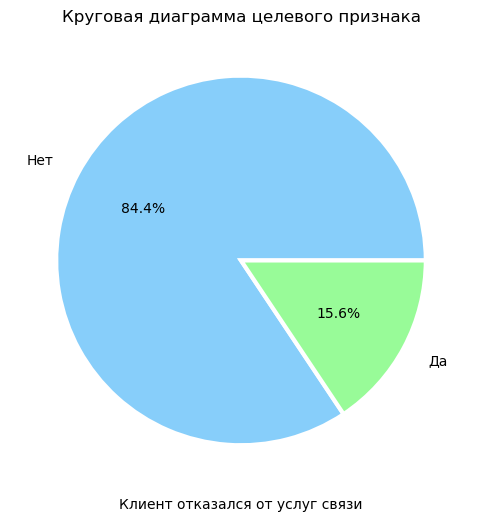

In [26]:
# Целевая переменная
plt.rcParams["figure.figsize"] = (10,6)
fig, ax = plt.subplots()
ax.pie(data['end_date'].value_counts(),
       labels=('Нет', 'Да'),
       autopct='%1.1f%%', labeldistance=1.15,
       wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' },
       colors=['lightskyblue', 'palegreen'])
plt.xlabel('Клиент отказался от услуг связи')
plt.title('Круговая диаграмма целевого признака')
plt.show()

In [27]:
# Функция визуализации с случайными цветами
def hist_countoplot_random(categ, data, x, hue, xlabel, ylabel, title, **kwargs):
    """
    categ - уникальные значения из любого категориального признака, по количеству которых будут определены цвета
    data - данные
    x - ость, по которой распределяются значения количественного признака
    hue - семантическая переменная, которая сопоставляется для определения цвета элементов графика.
    title - название гистограммы
    xlabel, ylabel - название осей
    **kwargs:
     - rotation=90 - угол поворота надписей по оси х
     - fig_size=(17, 4) - размер графиков
     - x_range=(0, 30) - ограничение диапазона по оси х
    Переменные categ и hue должны совпадать по количеству уникальных значений, так как палитра цветов строится на основе этого значения
    """

    # Случайные цвета
    def random_color():
        return "#{:06x}".format(random.randint(0, 0xFFFFFF))

    # Уникальные категории
    categories = categ

    # Случайные цвета для каждой категории
    colors_hist = {cat: random_color() for cat in categories}

    # Условие для переменного аргумента
    if 'fig_size' in kwargs:
        plt.figure(figsize=kwargs['fig_size'])
    else:
        plt.figure(figsize=(10, 4))

    # Гистограмма
    ax = sns.countplot(
        data,
        x=x,
        palette=colors_hist,
        hue=hue,
        stat='percent'
    )
    ax.set_title('График распределения категориального признака',  fontsize=12)

    # Количество наблюдений сверху каждого бара
    for p in ax.patches:
        height = int(p.get_height())
        # Offset для точной позиции надписи относительно центра бара
        ax.annotate(f"{height}",
                   xy=(p.get_x() + p.get_width() / 2., height),
                   xytext=(0, 3),  # Смещение вверх на 3 пикселя
                   textcoords="offset points",
                   ha='center', va='bottom')
    
    # Настройка оси Y для отображения целых чисел
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend(title=title, loc='upper right')

    # Условие для переменного аргумента
    if 'rotation' in kwargs:
        plt.xticks(rotation=kwargs['rotation'])

    plt.show()

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Для цветовой градации используем целевой признак `end_date`. Так мы поймем, как отказавшиеся от услуг взаимодействовали с компанией и составим примерный портрет плохого клиента.

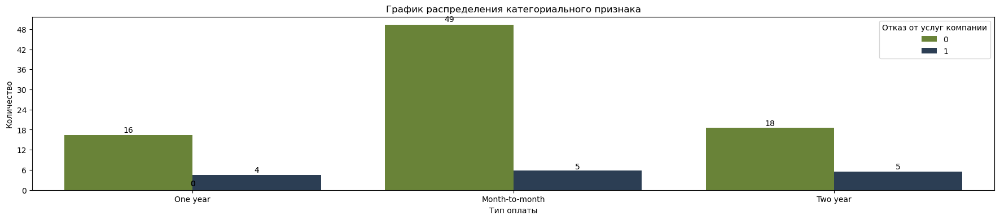

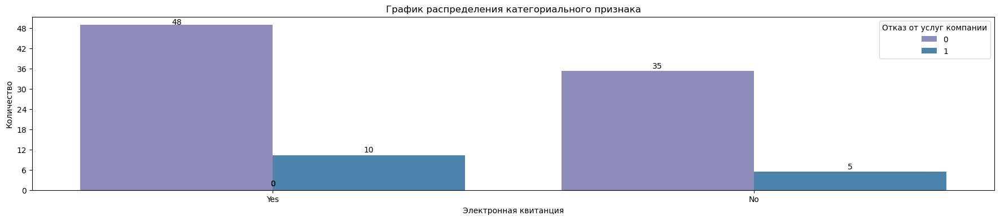

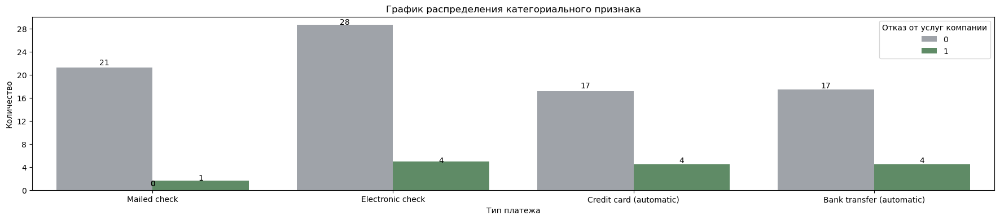

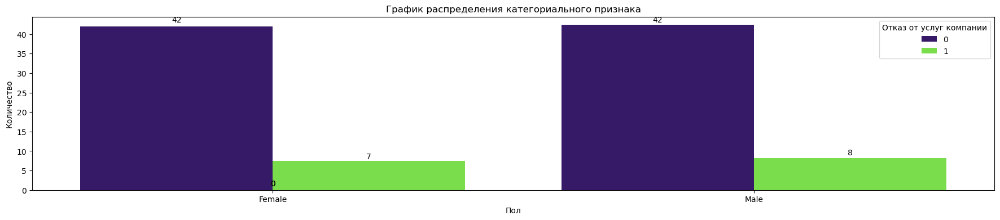

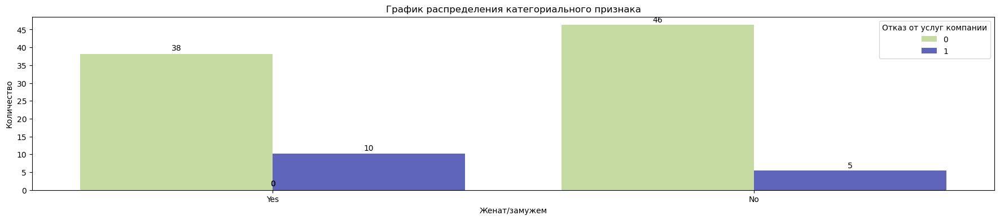

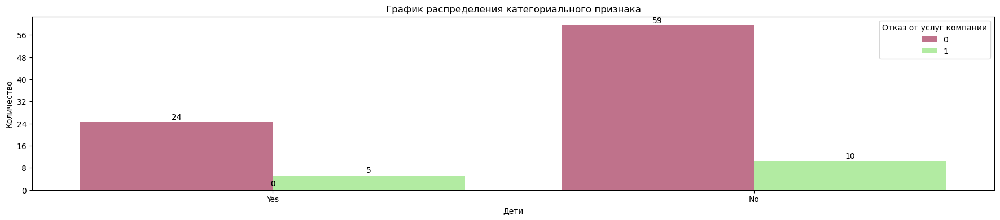

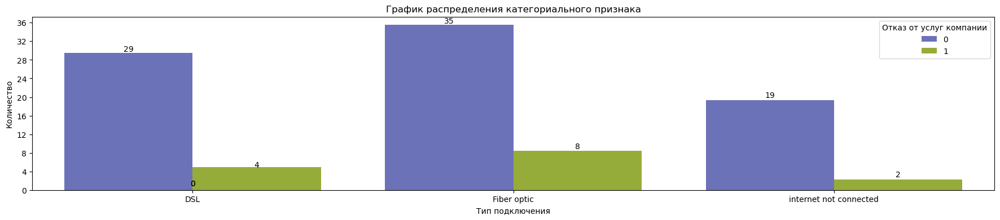

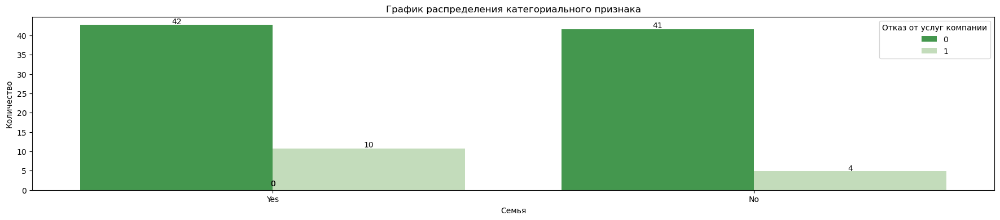

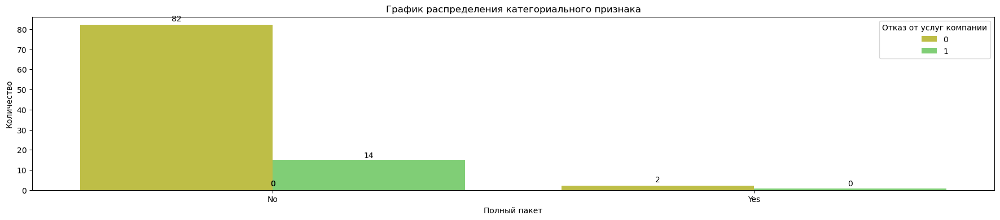

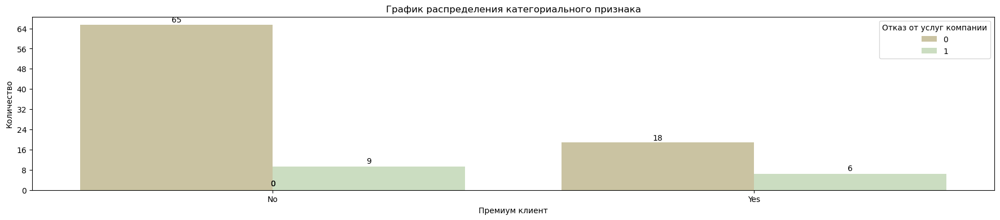

In [28]:
# Список признаков
cat_feature = [
    'type',
    'paperless_billing',
    'payment_method',
    'gender',
    'partner',
    'dependents',
    'internet_service',
    'status_family',
    'full_package',
    'premium_user'
]
# Список назвааний признаков
title_cat_feature = [
    'Тип оплаты',
    'Электронная квитанция',
    'Тип платежа',
    'Пол',
    'Женат/замужем',
    'Дети',
    'Тип подключения',
    'Семья',
    'Полный пакет',
    'Премиум клиент'
]

# Параллельный цикл по элементам списков с помощью zip
for feature, title in zip(cat_feature, title_cat_feature):
    hist_countoplot_random(
        data['end_date'].unique(),
        data,
        feature,
        'end_date',
        title,
        'Количество',
        'Отказ от услуг компании',
        fig_size=(22, 4)
        )

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Возможные предпосылки плохого клиента по признакам:

- чаще использует в типе оплаты - каждый месяц или раз в два года;
- чаще использует электронную квитанцию;
- чаще использует в типе платежа электронный чек, автоматический платеж с карты и трансфер в банке;
- женат;
- нет детей;
- в типе подключения - оптическое волокно;
- есть семья;
- не премиум клиент.

### Количественные признаки

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

В количисвенных признаках есть непрерывные величины, проведем анализ по выборкам разного размера - с помощью нормированной гистограммы с параметрами `common_norm=False`. Гистограммы такого типа позволяют нивелировать разницу в размерах выборок при анализе распределений. По оси Y будет не частота значений, а плотность распределения.

In [29]:
def hist_box_num_sub_random(categ, data, bins, x, hue, title, xlabel, ylabel, factor_vline, **kwargs):
    """
    categ - уникальные значения из любого категориального признака, по количеству которых будут определены цвета
    data - датафрейм
    bins - количество корзин
    x - ость, по которой распределяются значения количественного признака
    hue - семантическая переменная, которая сопоставляется для определения цвета элементов графика.
    title - название легенды
    xlabel, ylabel - название осей
    factor_vline - множитель для средней и медианы
    **kwargs:
     - rotation=90 - угол поворота надписей по оси х
     - fig_size=(17, 4) - размер графиков
     - x_range=(0, 30) - ограничение диапазона по оси х
     - y_range=(0, 30) - ограничение диапазона по оси y
    Переменные categ и hue должны совпадать по количеству уникальных значений, так как палитра цветов строится на основе этого значения
    """
    # Случайные цвета
    def random_color():
        return "#{:06x}".format(random.randint(0, 0xFFFFFF))

    # Уникальные категории
    categories = categ

    # Случайные цвета для каждой категории
    colors_hist = {cat: random_color() for cat in categories}
    colors_box = {cat: random_color() for cat in categories}

	# Вертикальные линии
    mean = np.mean(data[x])
    median = np.median(data[x])

    # Инициализация объекта Figure и создание подграфиков
    fig_size = kwargs['fig_size'] if 'fig_size' in kwargs else (10, 10)
    fig, axes = plt.subplots(2, 1, figsize=fig_size)

    # Установка диапазона по оси x, если задан
    if 'x_range' in kwargs:
        axes[0].set_xlim(kwargs['x_range'])
        axes[1].set_xlim(kwargs['x_range'])

    # Установка диапазона по оси Y, если задан
    if 'y_range' in kwargs:
        axes[0].set_ylim(kwargs['y_range'])
        y_max = kwargs['y_range'][1] * factor_vline  # Верхняя граница y_range
    else:
        y_max = axes[0].get_ylim()[1] * factor_vline  # Текущее значение, если y_range не задан

    sns.histplot(data=data,
                 x=x,
                 bins=bins,
                 hue=hue,
                 palette=colors_hist,
                 ax=axes[0],
                 kde=True,
                 multiple='stack',
                 legend=True
                )

    # Устанавливаем целые числа по оси Y
    axes[0].yaxis.set_major_locator(MaxNLocator(integer=True))
    axes[0].vlines(mean, 0, y_max, color='red', label='Среднее')
    axes[0].vlines(median, 0, y_max, color='blue', linestyle='--', label='Медиана')
    axes[0].set_title('Гистограмма количественного признака',  fontsize=12)
    axes[0].set_xlabel(xlabel)
    axes[0].set_ylabel(ylabel)

    sns.boxplot(data=data,
                x=x,
                hue=hue,
                palette=colors_box,
                ax=axes[1]
               )
    axes[1].set_title('Ящик с усами количественного признака',  fontsize=12)
    axes[1].set_xlabel(xlabel)
    axes[1].legend(title=hue, loc='upper left')
    plt.tight_layout()
    plt.show()

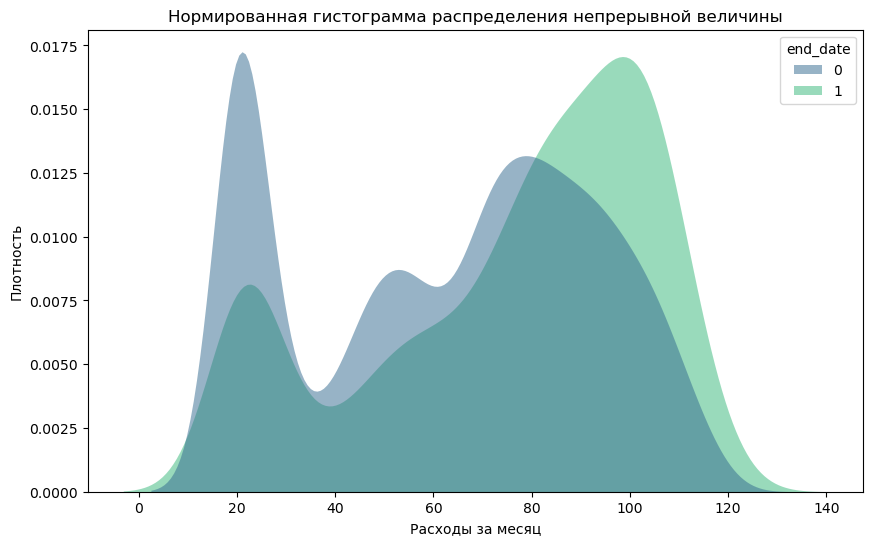

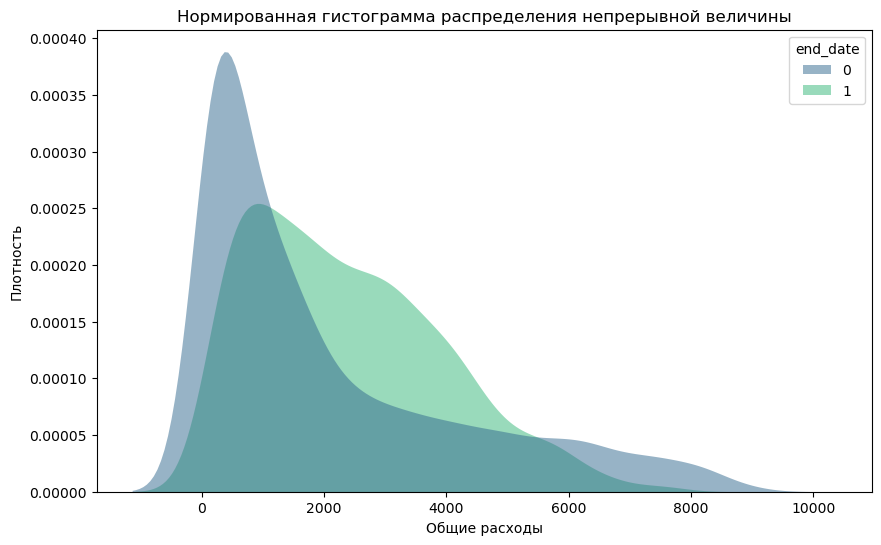

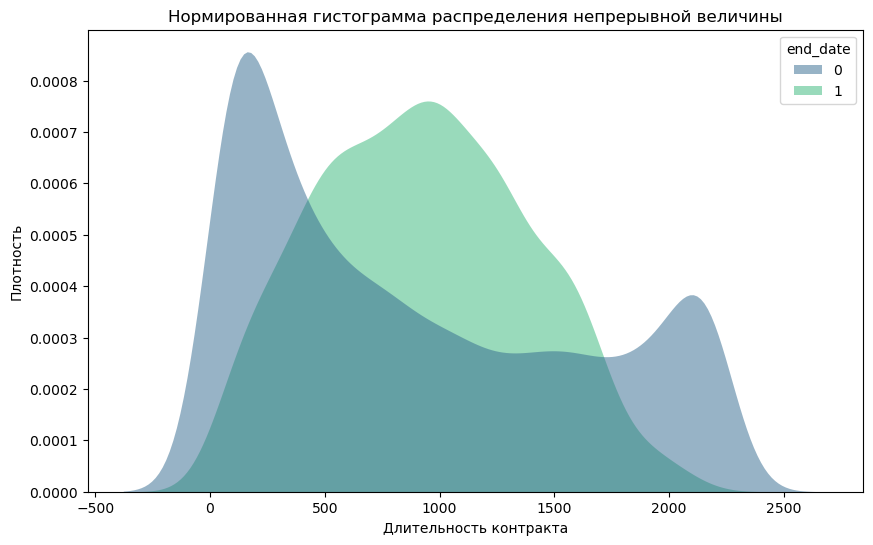

In [30]:
# Список признаков
num_feature = [
    'monthly_charges',
    'total_charges',
    'contract_length_days'
]

# Список назвааний признаков
title_num_feature = [
    'Расходы за месяц',
    'Общие расходы',
    'Длительность контракта'
]

# Параллельный цикл по элементам списков с помощью zip
for feature, title in zip(num_feature, title_num_feature):
    sns.kdeplot(
        data,
        x=feature,
        hue='end_date',
        palette='viridis',
        common_norm=False,
        fill=True,
        alpha=.5,
        linewidth=0
        )
    plt.title('Нормированная гистограмма распределения непрерывной величины', fontsize=12)
    plt.xlabel(title)
    plt.ylabel('Плотность')
    plt.show()

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

`number_services` - дискртеный признак, для его анализа нужнен график, который на каждое уникальные значение признака строит свою корзину.

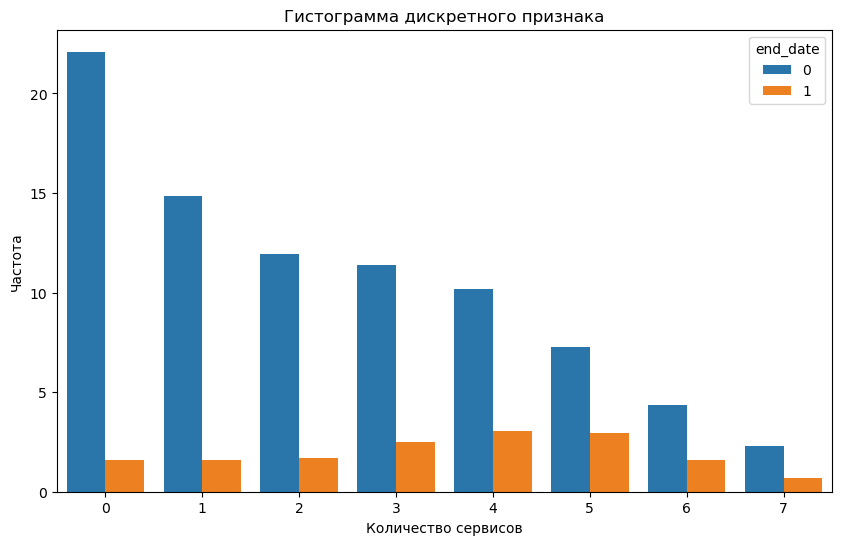

In [31]:
sns.countplot(data, x='number_services', hue='end_date', stat='percent', saturation=0.85)
plt.title('Гистограмма дискретного признака', fontsize=12)
plt.xlabel('Количество сервисов')
plt.ylabel('Частота')
plt.show()

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Выделим следующие моменты в этом этапе, категориальные признаки:
- в целевой переменной `end_date` есть дисбаланс, преобладает мажорный класс. Необходимо учесть этот факт при обучении моделей.

Числовые:
- признак `monthly_charges` имеет выбросы в районе 20 баксов, возможно была какая-то акция или промо коды;
- распределение признака `total_charges` похоже на экспоненциальное с присутствием выбросов;
- в `contract_length_days` консолидация в районе 2500, скорее всего это клиенты долгожители.

Возможные предпосылки плохого клиента по числовым признакам:

- месячные расходы в районе 100;
- общие расходы в районе 1000;
- в количестве услуг наибольшее количество 4 шт.

### Диаграмма рассеяния

In [32]:
# Тип категорий
cat = [
    'end_date',
    'type',
    'paperless_billing',
    'payment_method',
    'gender',
    'partner',
    'dependents',
    'internet_service',
    'status_family',
    'full_package',
    'premium_user',
    'senior_citizen',
    'multiple_lines',
    'online_security',
    'online_backup',
    'device_protection',
    'tech_support',
    'streaming_t_v',
    'streaming_movies',
    'number_services'
]
num = [
    'monthly_charges',
    'total_charges',
    'contract_length_days'
]

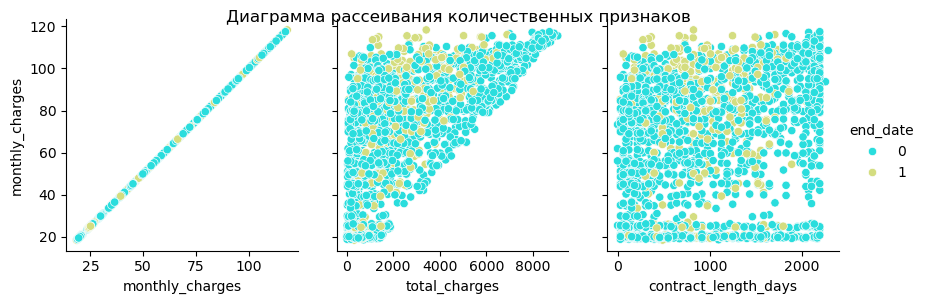

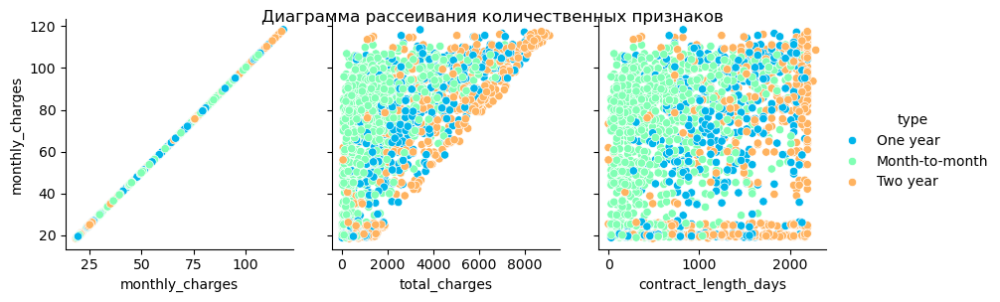

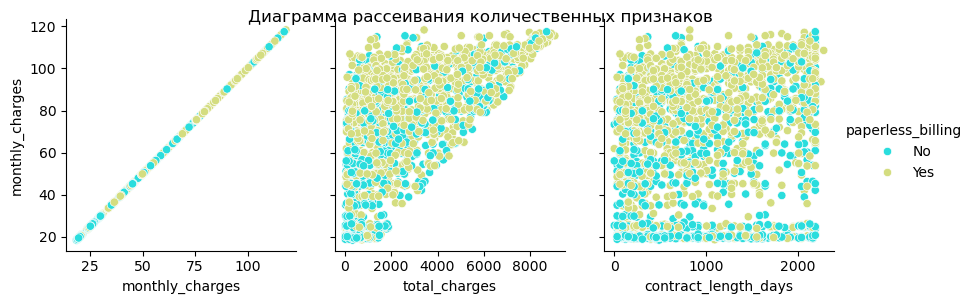

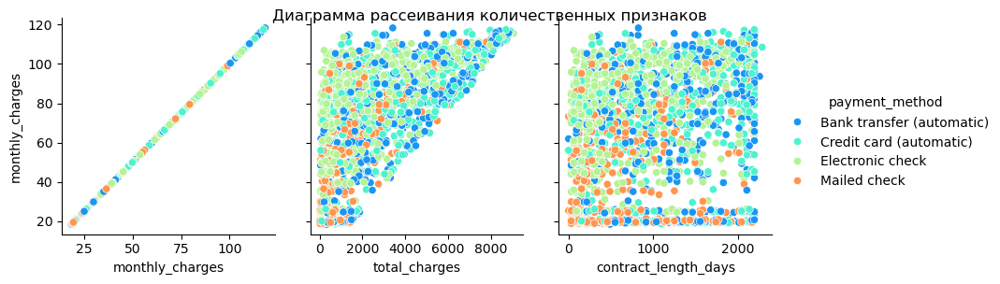

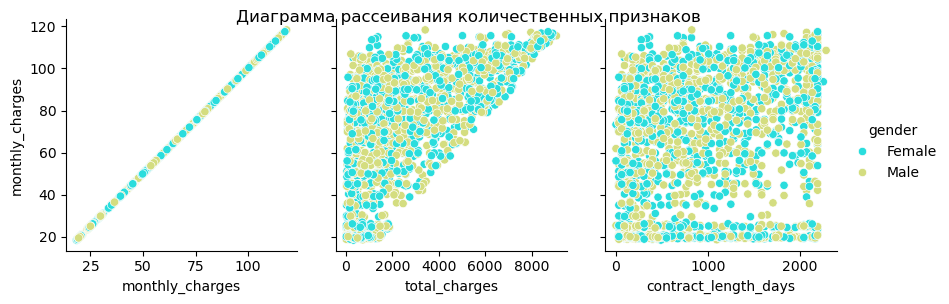

...

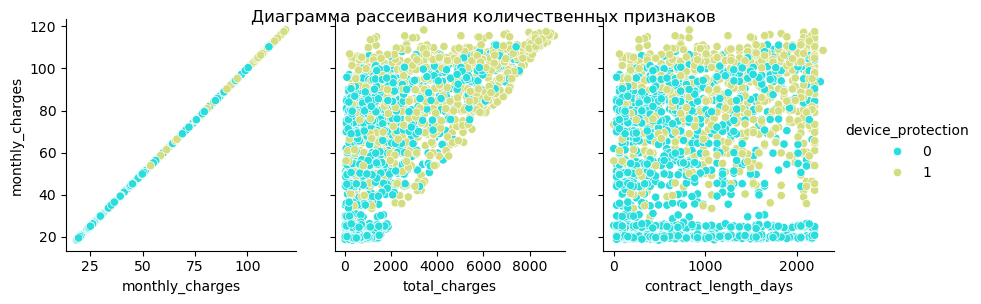

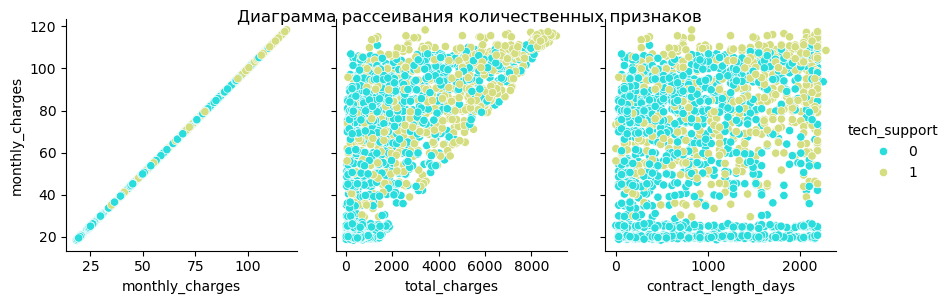

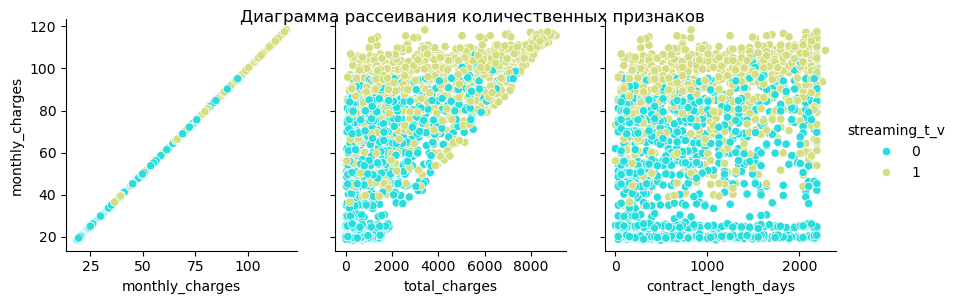

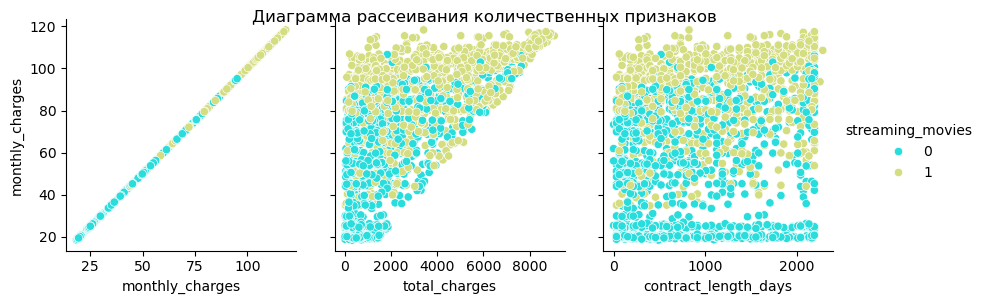

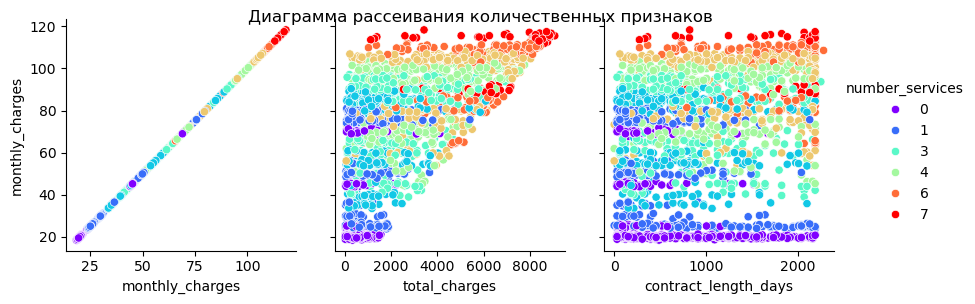

In [33]:
# Диаграмма
for category in cat:
    g = sns.PairGrid(
        data.sample(frac=0.3, random_state=RANDOM_STATE),
        hue=category,
        x_vars=num,
        y_vars='monthly_charges',
        palette='rainbow',
        height=3,
        aspect=0.95
    )
    g.map(sns.scatterplot)
    g.add_legend()
    plt.suptitle('Диаграмма рассеивания количественных признаков', fontsize=12)
    plt.show()

### Соотношения ушедших и оставшихся

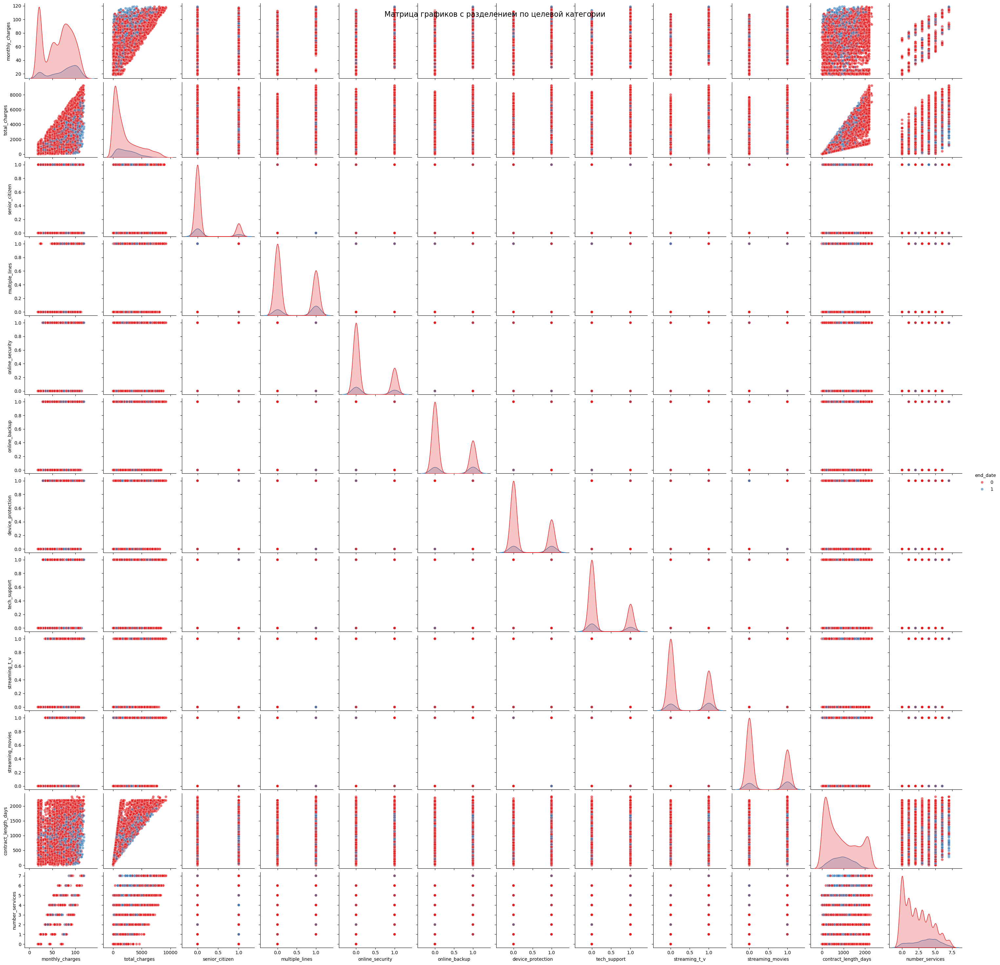

In [34]:
# Визуализация
sns.pairplot(data,
             hue='end_date',
             palette='Set1',
             plot_kws={'alpha': 0.6}
            )
plt.suptitle('Матрица графиков с разделением по целевой категории', fontsize=16)
plt.show()

### Корреляционный анализ

In [35]:
# Подсчет корреляции
phik_overview = phik_matrix(
    data.drop(
        ['begin_date'],
        axis=1
        ),
    interval_cols=num
)

In [36]:
# Размер матрицы
phik_overview.shape

(23, 23)

In [37]:
# Функция для матрицы корреляци
def plot_correlation_matrix(data, x_labels, y_labels, vmin, vmax, color_map, title, fontsize_factor, figsize):
    plt.figure(figsize=figsize)
    sns.heatmap(
        data,
        annot=True,
        fmt=".2f",
        cmap=color_map,
        vmin=vmin,
        vmax=vmax,
        cbar=False,
        linewidths=0.5,
        linecolor='gray',
        xticklabels=x_labels,
        yticklabels=y_labels
    )
    plt.title(title, fontsize=fontsize_factor * 10)
    plt.show()

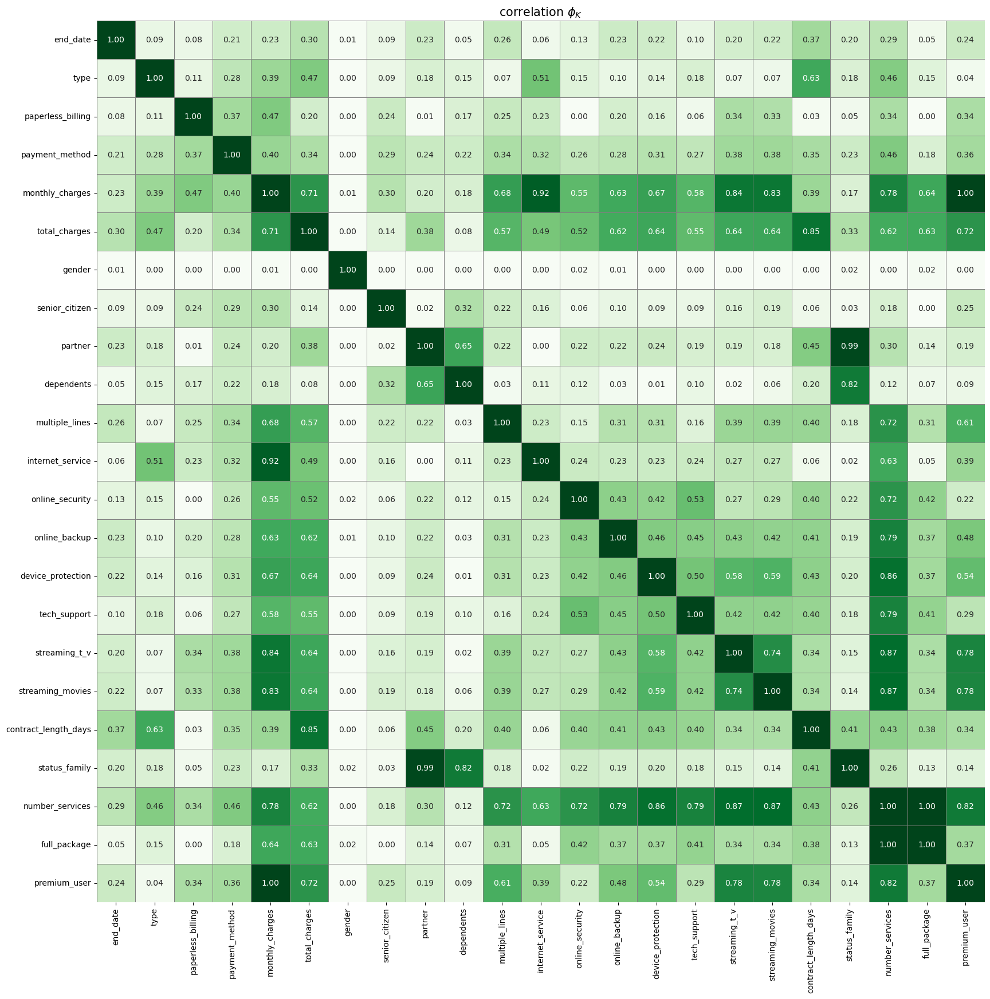

In [38]:
# Матрица
plot_correlation_matrix(
    phik_overview.values,
    x_labels=phik_overview.columns,
    y_labels=phik_overview.index,
    vmin=0, vmax=1, color_map='Greens',
    title=r'correlation $\phi_K$',
    fontsize_factor=1.5,
    figsize=(20, 20)
)

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

По итогу данного этапа выделим главное. Как ожидалось из созданных синтетических признаков есть мультикорреляция между `number_services` и `full_fackage`, `'monthly_charges'` и `premium_user`. Есть мультикорреляция между стоковыми `monthly_charges` и `internet_service`, `partner` и `status_family`. Утечка челевого признака отсутствует.


# Подготовка данных для обучения

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Для обучения используем следующие признаки:
- 'end_date',
- 'type',
- 'paperless_billing',
- 'payment_method',
- 'gender',
- 'partner',
- 'dependents',
- 'senior_citizen',
- 'multiple_lines',
- 'online_security',
- 'online_backup',
- 'device_protection',
- 'tech_support',
- 'streaming_t_v',
- 'streaming_movies'
- 'monthly_charges',
- 'total_charges',
- 'contract_length_days',
- 'number_services'

Для обучения нейросети можно добавить следующие мультикорреляционные признаки, так как она хороши с ними справляется:
- 'internet_service',
- 'status_family',
- 'full_package',
- 'premium_user'


In [39]:
feature = [
    'type',
    'paperless_billing',
    'payment_method',
    'gender',
    'partner',
    'dependents',
    'senior_citizen',
    'multiple_lines',
    'online_security',
    'online_backup',
    'device_protection',
    'tech_support',
    'streaming_t_v',
    'streaming_movies',
    'monthly_charges',
    'total_charges',
    'contract_length_days',
    'number_services'
]
feature_nn = [
    'internet_service',
    'status_family',
    'full_package',
    'premium_user'
]

In [40]:
# Создание выборок
TEST_SIZE = 0.25
X_train, X_test, y_train, y_test = train_test_split(
    data[feature],
    data['end_date'],
    test_size=TEST_SIZE,
    random_state=RANDOM_STATE,
    stratify=data['end_date']
)

# Обучение моделей

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Используем следующие модели:

- DecisionTreeClassifier;
- LGBMClassifier
- MLPClassifier


In [41]:
ohe_columns = [
    'type',
    'paperless_billing',
    'payment_method',
    'gender',
    'partner',
    'dependents',
    'senior_citizen',
    'multiple_lines',
    'online_security',
    'online_backup',
    'device_protection',
    'tech_support',
    'streaming_t_v',
    'streaming_movies',
    'number_services'
]

num_columns = [
    'monthly_charges',
    'total_charges',
    'contract_length_days',
]

# Пайплайн подготовки признаков из списка ohe_columns
ohe_pipe = Pipeline(
    [
        (
            'ohe',
            OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)
        )
    ]
    )

# Пайплайн подготовки признаков из списка num_columns
num_pipe = Pipeline(
    [
        (
            'num',
            RobustScaler()
        )
    ]
    )

# Пайплайн подготовки данных
data_preprocessor = ColumnTransformer(
    [
        ('ohe', ohe_pipe, ohe_columns),
        ('num', num_pipe, num_columns)
    ],
    remainder='passthrough'
    )

In [42]:
# Обучение пайплайна на тренировочных данных
X_train = data_preprocessor.fit_transform(X_train)
X_test = data_preprocessor.transform(X_test)

In [43]:
# Для данных OHE названия столбцов из шага пайплайна
X_train_pipe = pd.DataFrame(
    X_train,
    columns=data_preprocessor.get_feature_names_out()
)
X_test_pipe = pd.DataFrame(
    X_test,
    columns=data_preprocessor.get_feature_names_out()
)

## DecisionTreeClassifier

Точность ROC-AUC на кросс-валидации для DecisionTreeClassifier:0.73


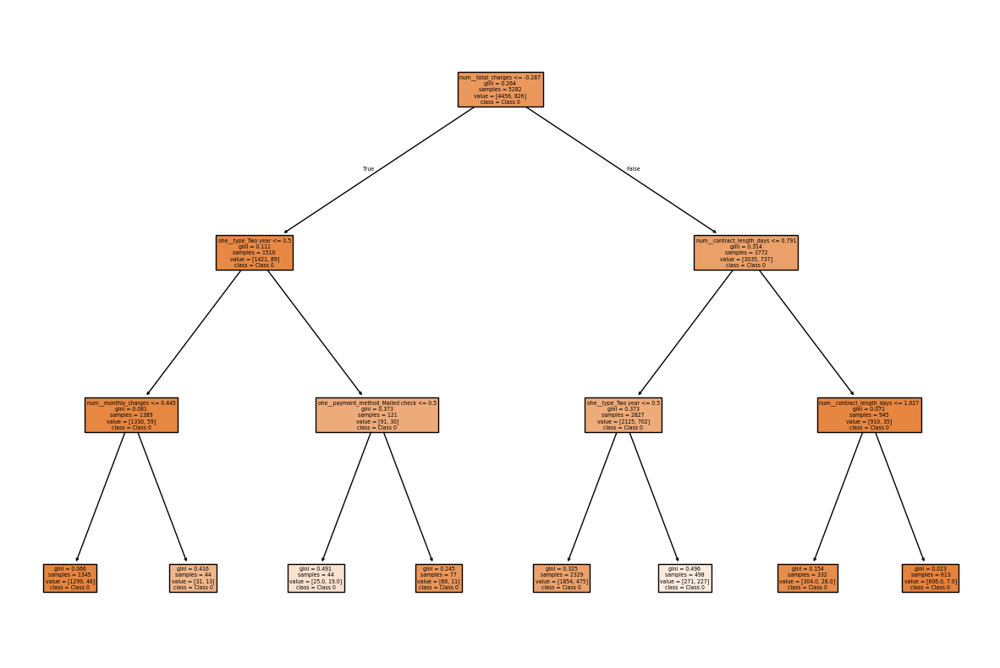

In [44]:
# Создание и обучение модели
model_dtc = DecisionTreeClassifier(max_depth=3, random_state=RANDOM_STATE)
model_dtc.fit(X_train_pipe, y_train)

# Подсчет времени
dtc_cv_time = time.time()

# Кросс-валидация
dtc_cv = cross_val_score(
    model_dtc,
    X_train_pipe,
    y_train,
    cv=5,
    scoring='roc_auc'
)

dtc_cv_end = round((time.time() - dtc_cv_time), 1)

# Среднее значении ROC-AUC
mean_dtc_cv = round(dtc_cv.mean(), 2)

print(f'Точность ROC-AUC на кросс-валидации для DecisionTreeClassifier:\
{mean_dtc_cv}')

# Визуализация дерева решений
plt.figure(figsize=(15, 10))
plot_tree(model_dtc, filled=True, feature_names=X_train_pipe.columns, class_names=['Class 0', 'Class 1'])
plt.show()

## LGBMClassifier

In [45]:
# Выбор модели LGBMClassifier
model_lgbm = LGBMClassifier(verbosity=-1, random_state=RANDOM_STATE)
model_lgbm.fit(X_train_pipe, y_train)

# Подсчет времени
lgbm_cv_time = time.time()

# Кросс-валидация
lgbm_cv = cross_val_score(
    model_lgbm,
    X_train_pipe,
    y_train,
    cv=5,
    scoring='roc_auc'
)

lgbm_cv_end = round((time.time() - lgbm_cv_time), 2)

# Среднее значении ROC-AUC
mean_lgbm_cv = round(lgbm_cv.mean(), 2)

print(f'Точность ROC-AUC на кросс-валидации для LGBM Classifier:\
{mean_lgbm_cv}')

Точность ROC-AUC на кросс-валидации для LGBM Classifier:0.86


## MLPClassifier

In [46]:
# Определение модели
model_mlpc = MLPClassifier(
    hidden_layer_sizes=(25, 5),  # Количество нейронов в скрытом слое
    activation='relu',  # Функция активации
    solver='adam',  # Оптимизатор
    alpha=0.01,  # Параметр регуляризации
    max_iter=200,  # Максимальное количество итераций
    random_state=RANDOM_STATE  # Фиксированное семя для воспроизводимости результатов
)

# Засекаем время
mlpc_cv_time = time.time()

# Кросс-валидация
mlpc_cv = cross_val_score(
    model_mlpc,
    X_train_pipe,
    y_train,
    cv=5,
    scoring='roc_auc'
)

mlpc_cv_end = round((time.time() - mlpc_cv_time), 2)

# Среднее значении ROC-AUC
mean_mlpc_cv = round(mlpc_cv.mean(), 2)

print(f'Точность ROC-AUC на кросс-валидации для LGBM MLPClassifier:\
{mean_mlpc_cv}')

/home/vital/anaconda3/envs/ds/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/vital/anaconda3/envs/ds/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/vital/anaconda3/envs/ds/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/vital/anaconda3/envs/ds/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Точность ROC-AUC на кросс-валидации для LGBM MLPClassifier:0.79


/home/vital/anaconda3/envs/ds/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [47]:
# Таблица с результатами
(
    pd.DataFrame({
        'Тип модели': [
            'DecisionTreeClassifier', 
            'LGBMClassifier', 
            'MLPClassifier'
        ],
        'Длительность кросс-валидации, сек.': [
            dtc_cv_end, 
            lgbm_cv_end, 
            mlpc_cv_end
        ],
        'Значение метрики ROC_AUC на трейне': [
            mean_dtc_cv, 
            mean_lgbm_cv, 
            mean_mlpc_cv
        ]
        })
    .set_index('Тип модели')
    .T
)

Тип модели,DecisionTreeClassifier,LGBMClassifier,MLPClassifier
"Длительность кросс-валидации, сек.",0.10,0.31,13.88
Значение метрики ROC_AUC на трейне,0.73,0.86,0.79


## Подбор гиперпараметров

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Лидирует `LGBMClassifair`, решим задачу улучшения метрики качества как к задачу оптимизации. Выполним подбор гиперпараметров с помощью `OptunaSearchCV`, которая использует байесовскую оптимизацию.

In [48]:
def objective(trial):
    # Гиперпараметры
    params = {
        # Количество листьев в дереве
        'num_leaves': trial.suggest_int('num_leaves', 15, 30),
        # Максимальная глубина дерева
        'max_depth': trial.suggest_int('max_depth', 10, 30),
        # Скорость обучения
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.1),
        # Количество деревьев в ансамбле
        'n_estimators': trial.suggest_int('n_estimators', 100, 250),
        # Частота пакетного градиентного бустинга
        'bagging_freq': trial.suggest_int('bagging_freq', 15, 25),
        # Семя
        'random_state': RANDOM_STATE
        }

    # Модель
    model = LGBMClassifier(**params)

    # Кросс-валидация
    scores = cross_val_score(
        model, 
        X_train_pipe, 
        y_train, 
        cv=5, 
        scoring='roc_auc'
    )
    return scores.mean()

In [49]:
# Оптимизатор с целью максимизации метрики
study = optuna.create_study(
    direction='maximize',
    sampler=optuna.samplers.TPESampler(seed=RANDOM_STATE))

[I 2025-07-20 23:27:15,923] A new study created in memory with name: no-name-92c95038-bd9f-4e82-a661-c79af6f84e83


In [50]:
# Оптимизация итерациями
optuna.logging.set_verbosity(optuna.logging.WARNING)
study.optimize(objective, n_trials=50)

# Среднее значении ROC-AUC
print(f'Точность ROC-AUC при лучших гиперпараметрах на кросс-валидации\
 для LGBM Classifier: {round(study.best_value, 2)}')
print(' ')
# Лучшие гиперпараметры
print(f'Лучшие гиперпараметры: {study.best_params}')

Точность ROC-AUC при лучших гиперпараметрах на кросс-валидации для LGBM Classifier: 0.88
 
Лучшие гиперпараметры: {'num_leaves': 23, 'max_depth': 11, 'learning_rate': 0.09919416841596163, 'n_estimators': 219, 'bagging_freq': 21}


In [51]:
# Карта оптимизации
fig = visualization.plot_contour(
    study,
    params=['num_leaves', 'bagging_freq']
)
fig.update_layout(
    title='Зависимость гиперпараметров и метрики качества',
    title_x=0.5,
    width=1000,
    height=900
)
fig.show()

# Тестирование модели

## Качество лучшей модели на тестовой выборке

In [52]:
lgbm_best = LGBMClassifier(**study.best_params)

# Обучение на лучших гиперпараметрах
lgbm_best.fit(X_train_pipe, y_train)

# Прогнозирование на тестовой выборке
y_pred = lgbm_best.predict(X_test_pipe)
y_pred_proba = lgbm_best.predict_proba(X_test_pipe)[:, 1]

# Оценка ROC-AUC
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f'Точность ROC-AUC на тесте для LGBM Classifier: {roc_auc:.2f}')

# Оценка точности модели
accuracy = accuracy_score(y_test, y_pred)
print(f'Точность Accuracy на тесте для LGBM Classifier: {accuracy:.2f}')

Точность ROC-AUC на тесте для LGBM Classifier: 0.91
Точность Accuracy на тесте для LGBM Classifier: 0.91


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Проверим на адекватность

In [53]:
# Обучение модели, стратегия prior
dummy_classifier = DummyClassifier(
    strategy='prior', 
    random_state=RANDOM_STATE
)
dummy_classifier.fit(X_train_pipe, y_train)

# Прогноз на тестовой выборке
y_dummy_pred = dummy_classifier.predict(X_test_pipe)
y_dummy_pred_proba = dummy_classifier.predict_proba(X_test_pipe)[:, 1]

# Оценка ROC-AUC
roc_auc_dummy = roc_auc_score(y_test, y_dummy_pred_proba)
print(f'Точность ROC-AUC на тесте для Dummy Classifier: {roc_auc_dummy:.2f}')

# Оценка точности 
accuracy_dummy = accuracy_score(y_test, y_dummy_pred)
print(f'Точность Accuracy на тесте для Dummy Classifier:\
{accuracy_dummy:.2f}')

# Сравнение
if roc_auc > roc_auc_dummy and accuracy > accuracy_dummy:
    print('Модель существенно превосходит базовую!')
elif roc_auc <= roc_auc_dummy or accuracy <= accuracy_dummy:
    print('Модель не показала преимущества перед базовой.')

Точность ROC-AUC на тесте для Dummy Classifier: 0.50
Точность Accuracy на тесте для Dummy Classifier:0.84
Модель существенно превосходит базовую!


<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

В нашем случае точность в 91% говорит о том, что из 100 реальных случаев отказа от услуг компании модель сможет правильно предсказать 91 образец

## Полнота и точность модели.

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

**Понимание ROC-кривой**

ROC-кривая строится на основе значений истинно положительных (TPR) и ложноположительных (FPR) с различными порогами классификации:

- **TPR (True Positive Rate)**: Доля правильно предсказанных положительных случаев (виновен), то есть $$TPR = \frac{TP}{TP + FN}$$
- **FPR (False Positive Rate)**: Доля неправильно предсказанных положительных случаев, то есть $$FPR = \frac{FP}{FP + TN}$$

ROC-кривая показывает, как меняется TPR при изменении FPR для различных порогов классификации.

**Понимание AUC**

AUC (Area Under the Curve) — это площадь под ROC-кривой. Значение AUC варьируется от 0 до 1:

- **AUC = 0.5**: Модель не лучше случайного угадывания. Это означает, что модель не может различить классы.
- **0.5 < AUC < 0.7**: Модель имеет слабую предсказательную способность.
- **0.7 ≤ AUC < 0.8**: Модель имеет удовлетворительную предсказательную способность.
- **0.8 ≤ AUC < 0.9**: Модель имеет хорошую предсказательную способность.
- **AUC ≥ 0.9**: Модель имеет отличную предсказательную способность.

**Интерпретация значений AUC**

- **AUC = 1**: Идеальная модель, которая правильно классифицирует все положительные и отрицательные примеры.
- **AUC < 0.5**: Модель работает хуже случайного угадывания; возможно, стоит пересмотреть подход к модели или данные.

**Применение в контексте задачи**

В нашей задаче с целевым признаком клиента "действующий" или "отказался":

- Если AUC близок к 1, это означает, что модель хорошо различает отказавшихся от услуг компании и действующих клиентов.
- Если AUC выше 0.7, это говорит о том, что модель может быть полезной для принятия решений.
- Если AUC близок к 0.5, это может указывать на то, что модель неэффективна и не может различать между двумя классами.

Далее построим график ROC-кривой

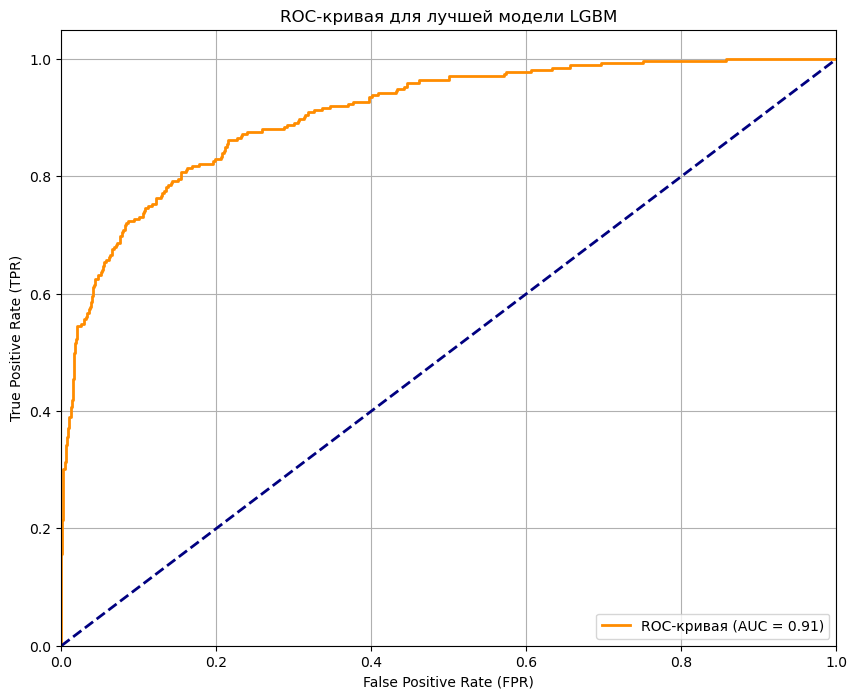

In [54]:
# Значения TPR и FPR для построения ROC-кривой
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Метрика AUC
roc_auc = auc(fpr, tpr)

# ROC-кривая
plt.figure(figsize=(10, 8))
plt.plot(
    fpr, 
    tpr, 
    color='darkorange', 
    lw=2, 
    label=f'ROC-кривая (AUC = {roc_auc:.2f})'
)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC-кривая для лучшей модели LGBM')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

## Матрица ошибок

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Опишем подробнее Precision (точность) и Recall (полнота). Это две важные метрики, используемые для оценки качества моделей бинарной
классификации. Они помогают понять, насколько хорошо модель справляется с задачей классификации.

### Основные понятия
В бинарной классификации у нас есть два класса: положительный - 1 (клиент отказался) и отрицательный - 0 (действующий клиент). При оценке модели мы можем получить четыре возможных результата:

- **True Positive (TP)**: количество правильно предсказанных положительных примеров.
- **True Negative (TN)**: количество правильно предсказанных отрицательных примеров.
- **False Positive (FP)**: количество отрицательных примеров, ошибочно предсказанных как положительные (также называется "ложные срабатывания") - **ошибки первого рода**
- **False Negative (FN)**: количество положительных примеров, ошибочно предсказанных как отрицательные (также называется "ложные пропуски") - **ошибки второго рода**

### Precision (Точность)
Измеряет долю правильно предсказанных положительных примеров (клиент отказался) среди всех примеров, которые модель предсказала как положительные.

**Интерпретация**:
- Высокое значение Precision указывает на то, что модель делает мало ложных срабатываний положительных примеров.
- Низкое значение Precision говорит о том, что много отрицательных примеров (действующий клиент) было ошибочно классифицировано как положительные (клиент отказался).

### Recall (Полнота)
Recall измеряет долю правильно предсказанных положительных примеров среди всех фактических положительных примеров. Эта метрика, обратная precision. На русском языке её называют полнотой. Она измеряет, смогла ли модель классификации присвоить класс 1 (клиент отказался) всем объектам этого класса. Это важно в нашей ситуации, когда ложные срабатывания (клиент по сути хочет отказаться, но модель предсказала как действуещего) имеют высокую стоимость. Потому что идея модели для удержания клиенттов строится именно на точости определения положительных примеров, чем точнее, тем эффективнее работает система.

**Интерпретация**:
- Высокое значение Recall указывает на то, что модель успешно находит большинство положительных примеров (клиент отказался). В реальности клиент собирается отказаться от услуг и модель предсказала это.
- Низкое значение Recall говорит о том, что много положительных примеров (клиент отказался) было пропущено.

### Trade-off между Precision и Recall
Часто существует компромисс между Precision и Recall. Увеличение одного может привести к снижению другого. Например:
- Если настроить модель так, чтобы она была более консервативной в своих прогнозах (например, требуя более строгих условий для того, чтобы классифицировать пример как положительный), можетно увеличить Precision за счет снижения Recall.
- И наоборот, если сделаеть модель более агрессивной в своих прогнозах (например, снижая порог вероятности для классификации), можно увеличить Recall за счет снижения Precision.

### Важные моменты
- **Контекст задачи**: в нашем случае ложные пропуски могут иметь серьезные последствия (например, клиент в будущем откажется от услуг, но модель это не определила), поэтому важно обратить внимание на **высокое значение Recall и минимизировать ошибки второго рода.**

### Заключение
Элементы главной диагонали матрицы ошибок (от верхнего левого до нижнего правого угла) представляют правильно классифицированные образцы. Чем больше значения на диагонали, тем лучше модель справляется с классификацией этих классов.

В нашей задаче ошибка первого рода — классифицировать активного клиента как собирающегося отказаться от услуг, а ошибка второго рода — определить клиента, который хочет отказаться от услуг как активного. Поэтому для нас будет важно получить минимальное количество **ошибок второго рода (FN)**, так как для компании это отличный шанс предотвратить отток клиентов, зная кто собирается отказаться от услуг.

In [55]:
# Функция матрицы ошибок
def conf_matrix_sns(
    model, 
    X_test, y_test, 
    min_interval, max_interval, 
    num_threholds, 
    xtick, 
    ytick
):
    '''
        model - исходная модель для получения предсказаний
        X_test - тестовая выборка, датафрейм после масштабирования и Ohe
        y_test - целевая переменная
        min_interval - минимум для порога
        max_interval - максимум для порога
        num_threholds - количество порогов
        xtick - подписи меток 0 и 1 по си Х
        ytick - подписи меток 0 и 1 по си У
    '''

    # Тблица с учетом порогов precision
    y_proba = model.predict_proba(X_test)[:,1]
    data_pre = pd.DataFrame(
        zip(y_test, y_proba),
        columns = ['y_test', 'y_proba']).sort_values(
        by='y_test', 
        ascending=False
    )

    # Пороги
    thresholds = [round(i,2) for i in np.linspace(
        min_interval, 
        max_interval, 
        num = num_threholds, 
        endpoint=False
    )]

    # Списки для хранения значений precision и recall
    prec_scores = []
    rec_scores = []

    # Precision и recall для каждого порога
    for i in thresholds:
        y_pred = (data_pre['y_proba'] >= i).astype(int)

        # Precision
        prec_result = precision_score(
            data_pre['y_test'], 
            y_pred, 
            zero_division=1.0
        )
        prec_scores.append(prec_result)

        # Recall
        rec_result = recall_score(
            data_pre['y_test'], 
            y_pred, 
            zero_division=1.0
        )
        rec_scores.append(rec_result)

    # DataFrame с результатами
    score = (
        pd.DataFrame({
            'Порог': thresholds,
            'Precision': prec_scores,
            'Recall': rec_scores
            }).set_index('Порог')
    )

    # Столбцы с порогами
    columns = []
    for i in thresholds:
    	columns.append('y_pred_'+str(i))
    	data_pre['y_pred_'+str(i)] = data_pre['y_proba'].apply(
            lambda x: 1 if x >= i else 0)

    # Фигура и сетка подграфиков (3x3)
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    fig.suptitle('Визуализация матрицы ошибок с порогами')

    # Цикл для создания матриц ошибок
    for i, threshold in enumerate(thresholds):
        # Генерируем название для графика
        title = f'Порог {threshold}'
        # Матрица ошибок
        cm = confusion_matrix(
            data_pre['y_test'], 
            data_pre[f'y_pred_{threshold}']
        )
        
        # Разделение на строки и колонки
        ax = axes[i // 3, i % 3]  

        # Тепловая карта
        sns.heatmap(
            cm, annot=True, fmt='d', cmap='viridis', ax=ax,
            xticklabels=xtick,
            yticklabels=ytick,
            cbar=False
            )

        ax.set_title(title)
        ax.set_xlabel('Предсказанные метки', labelpad=10)
        ax.set_ylabel('Истинные метки', labelpad=10)
        ax.yaxis.set_tick_params(rotation=90)

    # Скрытие пустых подграфиков
    for j in range(len(thresholds), num_threholds):
        fig.delaxes(axes[j // 3, j % 3])

    # Настройка отступов
    plt.tight_layout(pad=3)
    plt.subplots_adjust(top=0.95)

    return data_pre, score

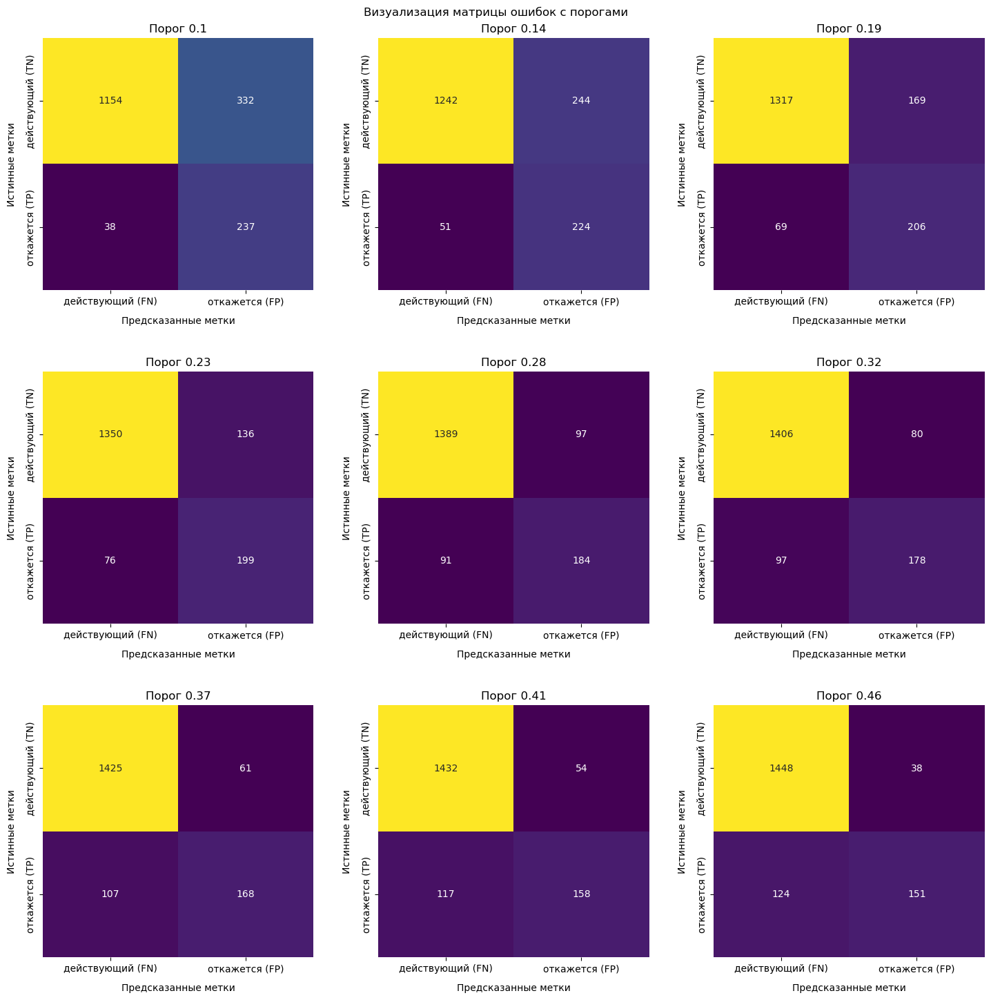

In [56]:
data_pre, score = conf_matrix_sns(
    lgbm_best,
    X_test_pipe,
    y_test,
    0.1,
    0.5,
    9,
    ['действующий (FN)', 'откажется (FP)'],
    ['действующий (TN)', 'откажется (TP)']
)

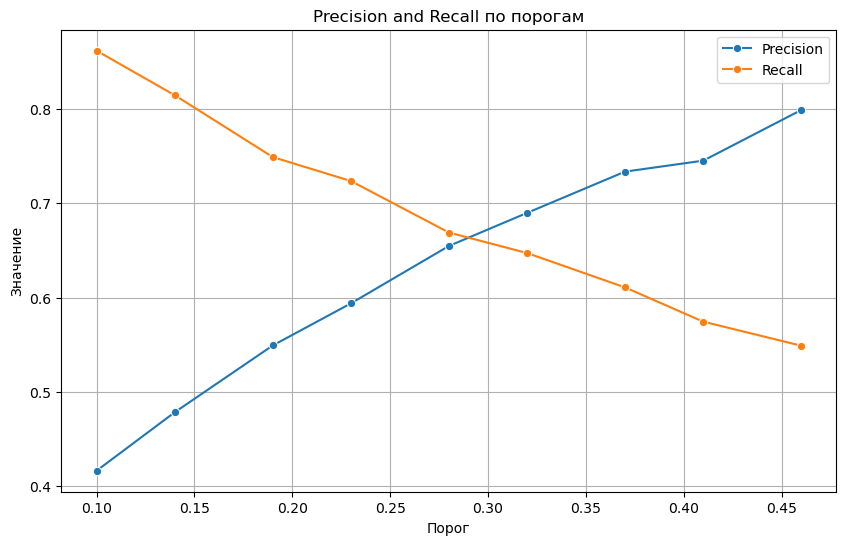

In [57]:
# Линейный график для Precision и Recall
plt.figure(figsize=(10, 6))
sns.lineplot(data=score, x='Порог', y='Precision', marker='o', label='Precision')
sns.lineplot(data=score, x='Порог', y='Recall', marker='o', label='Recall')
plt.title('Precision and Recall по порогам')
plt.xlabel('Порог')
plt.ylabel('Значение')
plt.legend()
plt.grid()
plt.show()

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Учитывая описанные выше факты и построенные графики есть минимальное количество ложных пропусков **False Negative** (ошибка второго рода) и самое высокое значение метрики **Recall**. Такой результат возможен с порогом 0.1:

- TN=1199
- **FN=38**
- TP=284
- FP=206

## Анализ важности признаков

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Для анализа важности основных факторов, влияющих на предсказание оттока клиентов используем следующие методы:

- `feature_importances_`
- `shap.Explainer`

In [58]:
# Функция для feature_importances_
def plot_feature_importance(model, X):
    # Важность признаков
    importance = model.feature_importances_

    # DataFrame для удобного отображения
    feature_importance = (
        pd.DataFrame({
            'Признак': X.columns,
            'Важность': importance
            })
        .sort_values(by='Важность', ascending=False)
        .set_index('Признак')
        .query('Важность > 5')
    )

    # Вывод важности признаков
    display(feature_importance.head(5))

    # Визуализация важности признаков
    plt.figure(figsize=(10, 10))
    plt.barh(
        feature_importance.index, 
        feature_importance['Важность'], 
        color='skyblue'
    )
    plt.xlabel('Важность')
    plt.ylabel('Признаки')
    plt.title('Важность признаков')
    plt.show()

    return feature_importance

,Важность
Признак,
num__contract_length_days,1789
num__monthly_charges,803
num__total_charges,777
ohe__partner_Yes,122
ohe__gender_Male,103


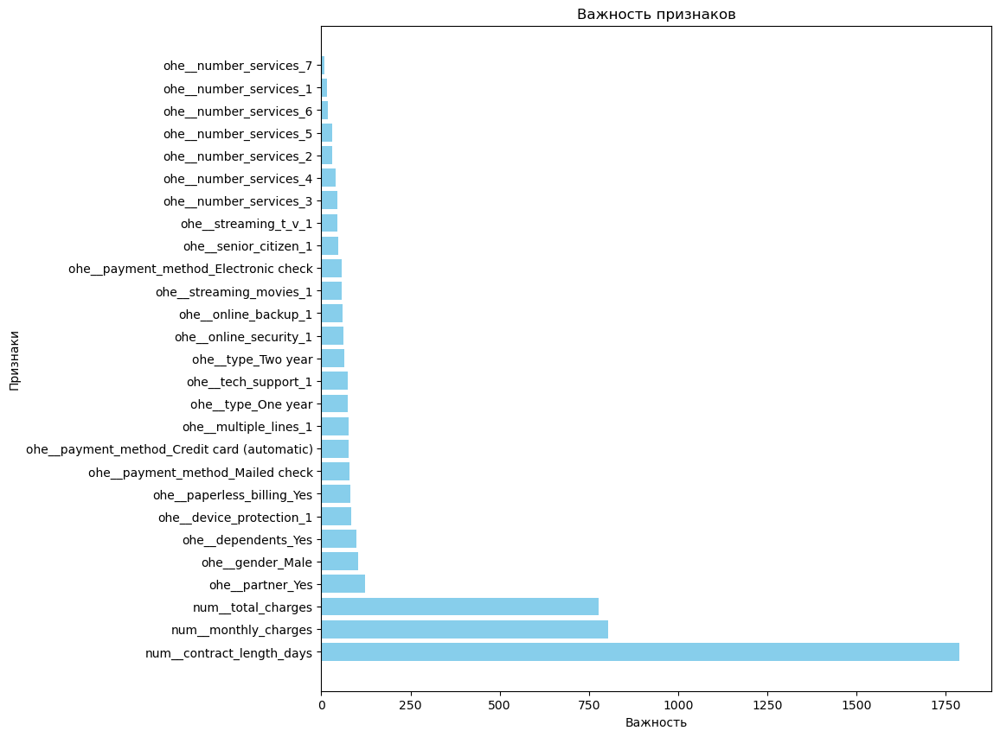

In [59]:
# Объекты feature_importances_
feature_importance_df = plot_feature_importance(lgbm_best, X_test_pipe)

In [60]:
# Функция для SHAP
def plot_shap_importance(model, X, top_feature, sample):
    """
    top_feature - лучший признак на основе графика 
    функции plot_feature_importance
    """

    # Создание объекта Explainer для SHAP
    explainer = shap.Explainer(model)

    # Получение значений SHAP для всех наблюдений
    shap_values = explainer(X)

    # График зависимости SHAP
    shap.dependence_plot(
        top_feature, 
        shap_values.values, 
        X, 
        display_features=X_train_pipe, 
    )
    plt.show()

    # Диаграмма плотности рассеяния SHAP-значений
    plt.title('Диаграмма плотности рассеяния SHAP-значений')
    plt.ylabel('Признаки')
    shap.summary_plot(
        shap_values,
        X,
        plot_size=[13, 6],
        )
    plt.show()
    
    # Визуализация SHAP-значений каскадной диаграммой 
    plt.title('Каскадная диаграмма SHAP-значений')
    plt.ylabel('Признаки')
    shap.plots.waterfall(shap_values[sample])
    plt.show()
    
    # Результаты усреднения SHAP‑значений по всем 
    # наблюдениям столбчатой диаграммы 
    plt.title('Столбчатая диаграмма усреднения SHAP-значений')
    plt.ylabel('Признаки')
    shap.plots.bar(shap_values)
    plt.show()

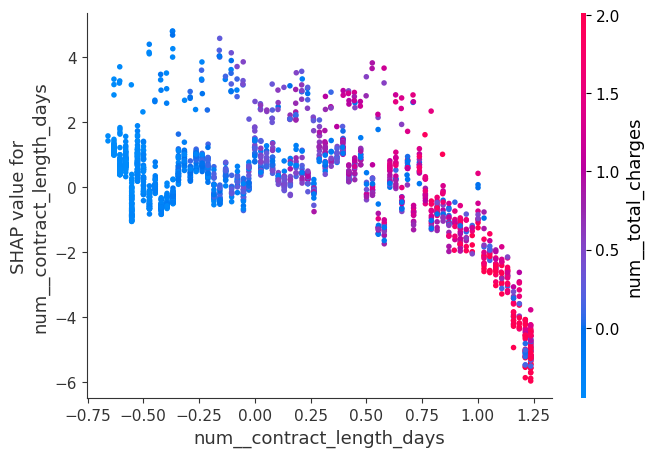

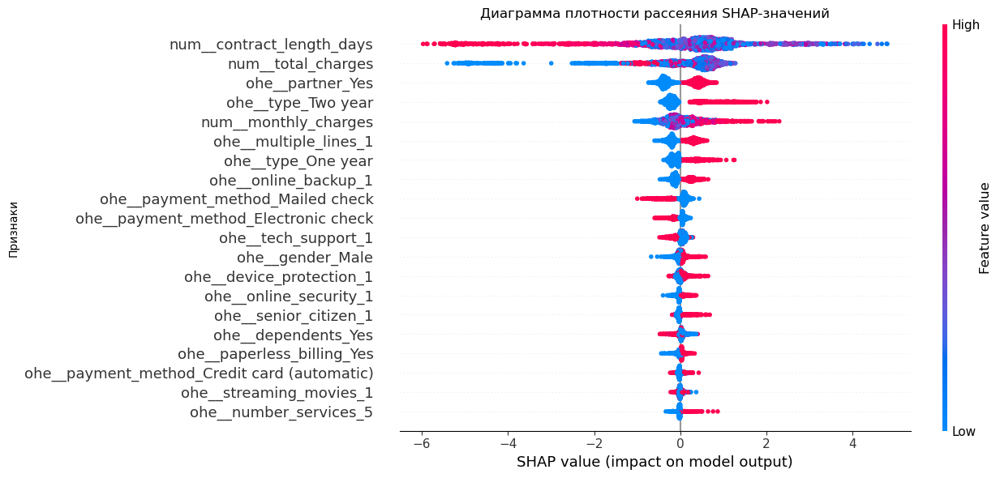

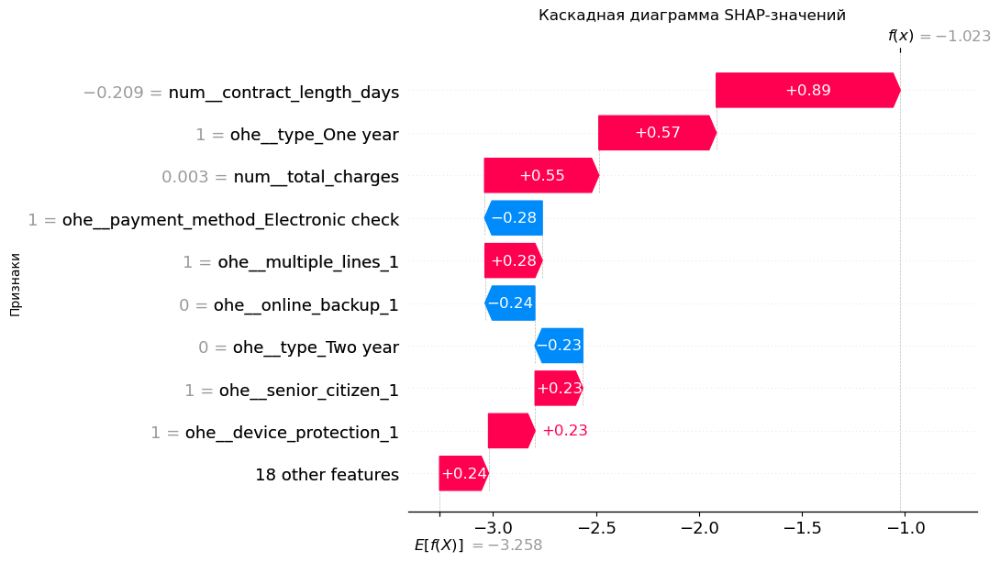

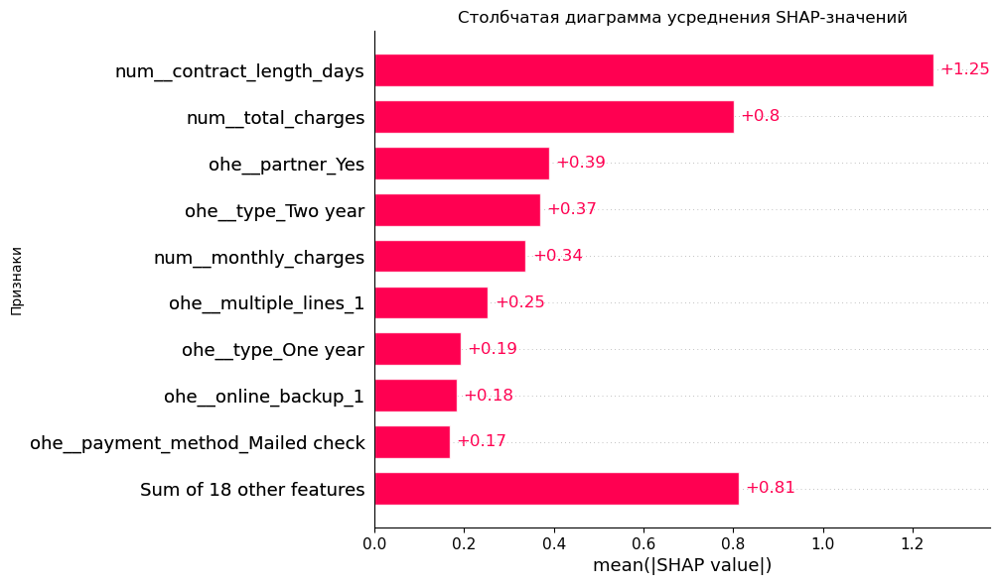

In [61]:
# Объекты SHAP
plot_shap_importance(
    lgbm_best, X_test_pipe,
    'num__contract_length_days',
    439
)

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

Для нашей модели важнейшим признаком является `contract_length_days`

## Дополнительное исследование contract_length_days

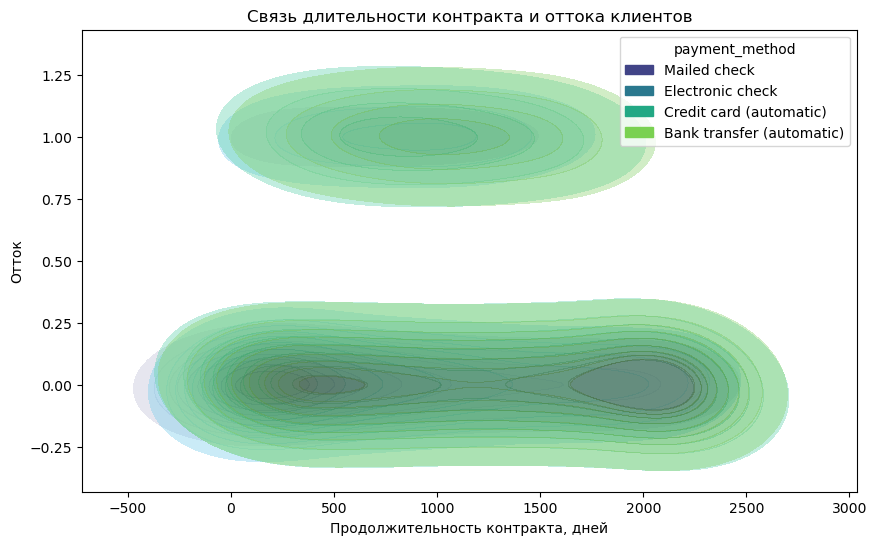

In [62]:
sns.kdeplot(
    data=data, 
    x='contract_length_days',
    y='end_date', 
    hue='payment_method',
    bw_adjust=1.2,
    fill=True,
    alpha=.4,
    common_norm=False,
    palette='viridis'
)
plt.title('Связь длительности контракта и оттока клиентов', fontsize=12)
plt.xlabel('Продолжительность контракта, дней')
plt.ylabel('Отток')
plt.show()

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

По графику можно сделать вывод. Максимальная плотность находится в районе 1000 дней, поэтому клиент расторгает договор примерно через три года использования услуг компании.

In [63]:
data.query('end_date == 1')['contract_length_days'].describe()

count    1101.000000
mean      924.863760
std       458.771309
min        28.000000
25%       577.000000
50%       915.000000
75%      1249.000000
max      2129.000000
Name: contract_length_days, dtype: float64

# Вывод

<div style="border:ridge violet 5px; padding: 30px; border-radius: 15px;">
<h3> На заметку <a class="tocSkip"> </h3>

В текущем проекте сделаем вывод по конкретным этапам:

**1. Загрузка данных.**

- в фрейме `phone` имя столбца `CustomerId` отличается от имени в техническом задании. Сделали такое же, как у остальных таблиц;
- все таблицы содержат данные;
- количество таблиц соответствует условию задачи;
- тип столбцов `MonthlyCharges и TotalCharges` не соответствует данным, которые в нем находятся.

**2. Предобработка.**

На данном этапе форматировали данные в числовой формат, изменили название столбцов. Дубликаты отсутствуют, пропуски заменили модой. Данные имеют очень хорошее качество.

**3. Статистический анализ.**

Стандартное отклонение метода `describe()` показывает не очень разнообразные показатели. Низкое отклонение — стабильные данные. Максимальные значения сильно выделяются, по сравнению с средним, возможно есть выбросы и аномалии.

**4. Сведение таблиц.**

Объединили таблицы по `ID клиента`, в нашем случае это индексы. При этом сортировали индексы, заменили образовавшиеся пропуски заглушкой.

**5. Новые признаки.**

Создали следующие синтетические признаки:

- `contract_length_days` - длительность контракта абонента в днях. Рассчитанная на основе разницы дат начала и конца оказания услуг с методом `qcut()` (obj) и референсной даты выгрузки датафреймов;
- `status_family` - наличие семьи. Комбинация признаков `partner` и `dependents` (Yes, No);
- `number_services` - количество используемых сервисов. Сумма `online_security, online_backup, device_protection, tech_support, streaming_t_v, streaming_movies, multiple_lines` (int);
- `full_ackage` - все сервисы активированы (Yes, No);
- `premium_user` - премиальный клиент на основе второго квантиля `monthly_charges`, если тратит в месяц больше 70$ (Yes, No).

Так же выделили целевую переменную `end_date`

**6. Статистический анализ сведенной таблицы data.**

- в минимальном значении метода `describe()` есть нули, удалили эти строки.

**7. Визуализация.**

Выделили следующие моменты в этом этапе.

Категориальные признаки:

- в целевой переменной `end_date` есть дисбаланс, преобладает мажорный класс. Учли этот факт при обучении моделей.

Числовые:

- признак `monthly_charges` имеет выбросы в районе 20 баксов, возможно была какая-то акция или промо-коды;
- распределение признака `total_charges` похоже на экспоненциальное с присутствием выбросов;
- в `contract_length_days` консолидация в районе 2500, скорее всего это клиенты долгожители.

**8. Соотношения ушедших и оставшихся.**

Видно образование кластеров, так как у нас разделение на два типа клиентов.

**9. Корреляционный анализ** 

По итогу данного этапа выделим главное. Есть мультикорреляция между `number_services` и `full_fackage`, `'monthly_charges'` и `premium_user`. Есть мультикорреляция между стоковыми `monthly_charges` и `internet_service`, `partner` и `status_family`. Утечка челевого признака отсутствует.

**10. Подготовка данных для обучения.**

Использовали следующие признаки:

- 'end_date',
- 'type',
- 'paperless_billing',
- 'payment_method',
- 'gender',
- 'partner',
- 'dependents',
- 'senior_citizen',
- 'multiple_lines',
- 'online_security',
- 'online_backup',
- 'device_protection',
- 'tech_support',
- 'streaming_t_v',
- 'streaming_movies'
- 'monthly_charges',
- 'total_charges',
- 'contract_length_days',
- 'number_services'

Для обучения нейросети добавили следующие мультикорреляционные признаки, так как она хорошо с ними справляется:

- 'internet_service',
- 'status_family',
- 'full_package',
- 'premium_user'

**11. Обучение моделей.**

Использовали следующие модели:

- DecisionTreeClassifier;
- LGBMClassifier
- MLPClassifier

|Тип модели|DecisionTreeClassifier|LGBMClassifier|MLPClassifier|
|---|---|---|---|
|Длительность кросс-валидации, сек.|0.10|0.40|19.54|
|Значение метрики ROC_AUC на трейне|0.73|0.86|0.79|

**12. Подбор гиперпараметров.**

Лидирует `LGBMClassifair`, решили задачу улучшения метрики качества как к задачу оптимизации. Выполнили подбор гиперпараметров с помощью `OptunaSearchCV`, которая использует байесовскую оптимизацию.

Точность ROC-AUC при лучших гиперпараметрах тренировочной выборки на кросс-валидации для `LGBM Classifier`: 0.86

**13. Тестирование модели.**

Качество лучшей модели на тестовой выборке:

- Точность ROC-AUC на тесте для LGBM Classifier: 0.91
- Точность Accuracy на тесте для LGBM Classifier: 0.91

**14. Матрица ошибок.**

Элементы главной диагонали матрицы ошибок (от верхнего левого до нижнего правого угла) представляют правильно классифицированные образцы. Чем больше значения на диагонали, тем лучше модель справляется с классификацией этих классов.

В нашей задаче ошибка первого рода — классифицировать активного клиента как собирающегося отказаться от услуг, а ошибка второго рода — определить клиента, который хочет отказаться от услуг, как активного. Поэтому для нас будет важно получить минимальное количество **ошибок второго рода (FN)**, так как для компании это отличный шанс предотвратить отток клиентов, зная кто собирается отказаться от услуг.

Учитывая описанные выше факторы и построенные графики есть минимальное количество ложных пропусков **False Negative** (ошибка второго рода) и самое высокое значение метрики **Recall**. Такой результат возможен с порогом 0.1:

- TN=980
- **FN=38**
- TP=503
- FP=251

**15. Анализ важности признаков.**

Для анализа важности основных факторов, влияющих на предсказание оттока клиентов использовали следующие методы:

- `feature_importances_`
- `shap.Explainer`

Для нашей модели важнейшим признаком является `contract_length_days`.

По графику связи длительности контракта и оттока клиентов можно сделать вывод. Максимальная плотность находится в районе 1000 дней, поэтому клиент расторгает договор примерно **через три года** использования услуг компании.

**16. Портрет плохого клиента.**

- чаще использует в типе оплаты - каждый месяц или раз в два года;
- чаще использует электронную квитанцию;
- чаще использует в типе платежа электронный чек, автоматический платеж с карты и трансфер в банке;
- женат;
- нет детей;
- в типе подключения - оптическое волокно;
- есть семья;
- не премиум клиент;
- месячные расходы в районе 100;
- общие расходы в районе 1000;
- в количестве услуг наибольшее количество - 4 шт.

**17. Ощий вывод.**

Для компании, предоствляющей телекоммуникационные услуги важно присутствие клиентов с максимальной продолжительностью контракта. Чтобы достичь высокого показателя нужно стимулировать новых клиентов различными промо-акциями и предложениями. Проводить розыгрышы и конкурсы, реферальные программы и скидки на услуги. Так же важно отслеживать цены других компаний для оптимального поддержания стоимости услуг. Так как в телекоммуникационой отрасли достаточно большая конкуренция. Плюс к этому нужно особое внимание уделить клиентам, которые пользуются услугами примерно три года.